In [1]:
%load_ext autoreload
%autoreload

In [2]:
from utils_v1 import *


In [3]:
from icecream import ic
import pdb
from sklearn import metrics
import importlib
import utils_v1
import tracemalloc
import sys
import numpy as np
from src.dataset import (
    MultipleDates,
    PAMultipleDates,
    MTMultipleDates,
    MAMultipleDates,
    MSMultipleDates,
    PIMultipleDates,
    MOMultipleDates,
    L8MTMultipleDates,
    L8AMMultipleDates
)

# from src.dataset_legacy import MTDeforestationTime
from src import training_generator as generator
from src.patchesHandler import PatchesHandler, PatchesHandlerMultipleDates
from src.manager.multioutput import ManagerMCDropout, ManagerSingleRun, ManagerEnsemble, ManagerEvidential2, ManagerTTA
from src.Logger import Logger
import src.rasterTools as rasterTools



Tensorflow ver. 2.6.0


In [4]:
ic.configureOutput(includeContext=True)

In [5]:
useLessInferenceRuns = False
reducedInferenceRuns = 30

In [6]:
config = {
	"training": False,
	"inferring": True,
	"site": "MS", # values: MT, PA, MS, PI, L8MT, L8AM
	"training_date": "earlier", # values: earlier, current
	"mode": "single_run", # values: mcd, single_run, ensemble, evidential2, tta
	"uncertainty_method": "pred_entropy_single", # pred_var MI pred_entropy KL pred_entropy_single
	"loadInference": False,
	"removePolygons": True,
	"plotLandsat": False,
	"plotPOI": False,

	"save_probabilities": False,
	"addPastDeforestationInput": True,
	"classes_mode": False,																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																																						
	"learning_rate": 1e-4,
    "use_cloud_mask": False,
    "mask_out_non_biome": False,
	# "mask_out_no_data": True


	"georreferenced_save": False,
	"drop_no_data_pixels": False,
	"use_entire_image_as_training": False

}

In [7]:



if config['mode'] == 'mcd':
	managerClass = ManagerMCDropout
	config['inference_times'] = 10
	config['training_times'] = 1
elif config['mode'] == 'single_run':
	managerClass = ManagerSingleRun
	config['inference_times'] = 1
	config['training_times'] = 1
	config['uncertainty_method'] = 'pred_entropy_single'
elif config['mode'] == 'ensemble':
	managerClass = ManagerEnsemble
	config['inference_times'] = 10
	config['training_times'] = 10
elif config['mode'] == 'evidential2':
	managerClass = ManagerEvidential2
	config['inference_times'] = 1
	config['training_times'] = 1
elif config['mode'] == 'tta':
	managerClass = ManagerTTA
	config['inference_times'] = 10
	config['training_times'] = 1
else:
	raise ValueError('Invalid mode')

print(config)

if config['site'] == 'PA':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2017, 2018]
	else:
		dates = [2018, 2019]
	datasetClass = PAMultipleDates
elif config['site'] == 'MT':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2018, 2019]
	else:
		dates = [2019, 2020]
	datasetClass = MTMultipleDates
elif config['site'] == 'MS':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2018, 2019]
		# dates = [2019, 2020]

	else:
		dates = [2019, 2020]
		# dates = [2020, 2021]

	datasetClass = MSMultipleDates
elif config['site'] == 'PI':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2018, 2019]
		# dates = [2017, 2018]

	else:
		dates = [2019, 2020]
		# dates = [2018, 2019]

	datasetClass = PIMultipleDates
	config['mask_out_non_biome'] = True
elif config['site'] == 'MO':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2018, 2019]
	else:
		dates = [2019, 2020]
	datasetClass = MOMultipleDates
elif config['site'] == 'L8MT':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2021, 2022]
	else:
		dates = [2022, 2023]
		# dates = [2021, 2022]
	datasetClass = L8MTMultipleDates
elif config['site'] == 'L8AM':
	if config['training'] == True and config['training_date'] == 'earlier':
		dates = [2021, 2022]
	else:
		dates = [2022, 2023]
	datasetClass = L8AMMultipleDates

else:
	raise ValueError('Invalid site')

dataset = datasetClass(config = config,
			   dates = dates, 
	 	addPastDeforestationInput = config['addPastDeforestationInput'],
		borderBuffer = 2)	


if issubclass(type(dataset), MultipleDates):
	patchesHandler = PatchesHandlerMultipleDates(
		dataset)
else:
	patchesHandler = PatchesHandler()

if managerClass == ManagerTTA:
	patchesHandler.test_time_augmentation = True


if config['training'] == False:

	if type(dataset) == PAMultipleDates:


		if config['training_date'] == 'current': exp = 0; repetition_id = 0
		elif config['training_date'] == 'earlier': 
			exp = 1; repetition_id = 0
			# exp = 20; repetition_id = 0
			# exp = 50; repetition_id = 0

	elif type(dataset) == MTMultipleDates:
		
		if config['training_date'] == 'current': exp = 2; repetition_id = 8
		elif config['training_date'] == 'earlier': exp = 3; repetition_id = 6		

	elif type(dataset) == MSMultipleDates:

		if config['training_date'] == 'current': exp = 40; repetition_id = 0
		elif config['training_date'] == 'earlier': 
			# exp = 5; repetition_id = 0		
			# exp = 24; repetition_id = 0	
			# exp = 30; repetition_id = 0	# L1C
			exp = 37; repetition_id = 0	# L1C (New)
			
	elif type(dataset) == PIMultipleDates:

		if config['training_date'] == 'current': 
			exp = 44; repetition_id = 4
			exp = 58; repetition_id = 0
		elif config['training_date'] == 'earlier': 
			exp = 7; repetition_id = 0	
			## exp = 18; repetition_id = 0	
			exp = 27; repetition_id = 0 # L1C
			# exp = 28; repetition_id = 0 # L1C 2020
	elif type(dataset) == MOMultipleDates:

		if config['training_date'] == 'current': exp = 6; repetition_id = 0
		elif config['training_date'] == 'earlier': 
			exp = 7; repetition_id = 0	
			exp = 19; repetition_id = 0	
	elif type(dataset) == L8MTMultipleDates:

		if config['training_date'] == 'current': exp = 38; repetition_id = 0
		elif config['training_date'] == 'earlier': 
			
			exp = 38; repetition_id = 0	
	elif type(dataset) == L8AMMultipleDates:

		if config['training_date'] == 'current': exp = 38; repetition_id = 0
		elif config['training_date'] == 'earlier': 
			
			exp = 39; repetition_id = 0	

else:

	exp = 61
	repetition_id = 0
	
logger = Logger()
manager = managerClass(config, dataset, patchesHandler, logger)
manager.defineExperiment(exp)


{'training': False, 'inferring': True, 'site': 'MS', 'training_date': 'earlier', 'mode': 'single_run', 'uncertainty_method': 'pred_entropy_single', 'loadInference': False, 'removePolygons': True, 'plotLandsat': False, 'plotPOI': False, 'save_probabilities': False, 'addPastDeforestationInput': True, 'classes_mode': False, 'learning_rate': 0.0001, 'use_cloud_mask': False, 'mask_out_non_biome': False, 'georreferenced_save': False, 'drop_no_data_pixels': False, 'use_entire_image_as_training': False, 'inference_times': 1, 'training_times': 1}


ic| dataset.py:610 in __init__()- list(self.date_ids): [0]
ic| dataset.py:631 in __init__()
    self.image_channels: [[0, 1, 2, 3, 4, 5, 6, 7, 8]]
ic| patchesHandler.py:189 in __init__()- self.input_image_shape: 9
ic| patchesHandler.py:190 in __init__()
    self.dataset.image_channels: [[0, 1, 2, 3, 4, 5, 6, 7, 8]]


In [8]:
patchesHandler

In [9]:
repetition_id

0

In [10]:
exp

37

In [11]:
dates

[2019, 2020]

In [12]:
manager.config

{'training': False,
 'inferring': True,
 'site': 'MS',
 'training_date': 'earlier',
 'mode': 'single_run',
 'uncertainty_method': 'pred_entropy_single',
 'loadInference': False,
 'removePolygons': True,
 'plotLandsat': False,
 'plotPOI': False,
 'save_probabilities': False,
 'addPastDeforestationInput': True,
 'classes_mode': False,
 'learning_rate': 0.0001,
 'use_cloud_mask': False,
 'mask_out_non_biome': False,
 'georreferenced_save': False,
 'drop_no_data_pixels': False,
 'use_entire_image_as_training': False,
 'inference_times': 1,
 'training_times': 1,
 'dropout_training': False}

In [13]:
exp

37

In [14]:
manager

In [15]:
manager.setExperimentPath()
manager.createLogFolders()

In [16]:
# ic(type(dataset), exp, dataset.dates)


In [17]:

manager.loadLabel()

D:/Jorge/datasets/deforestation/MS/deforestation_past_years.tif
Loaded deforestation past years


ic| dataset.py:708 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Label where deforestation past years is actual date (2020) = 1


ic| dataset.py:711 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation different from 0 (no deforestation)


ic| dataset.py:715 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation before 2008 is 2
D:/Jorge/datasets/deforestation/MS/deforestation_before_2000_MS.tif


ic| dataset.py:719 in loadLabelFromDate()
    np.unique(label_past_deforestation_before_2008, return_counts=True): (array([  0, 208], dtype=uint8), array([126708038, 235735967], dtype=int64))
ic| dataset.py:721 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))
ic| dataset.py:700 in loadLabel()
    label_per_date.shape: (18605, 19481, 1)


Removing bufer................
Mask label shape:  
 (18605, 19481, 1) 
 Unique values:  
 [0 1 2]


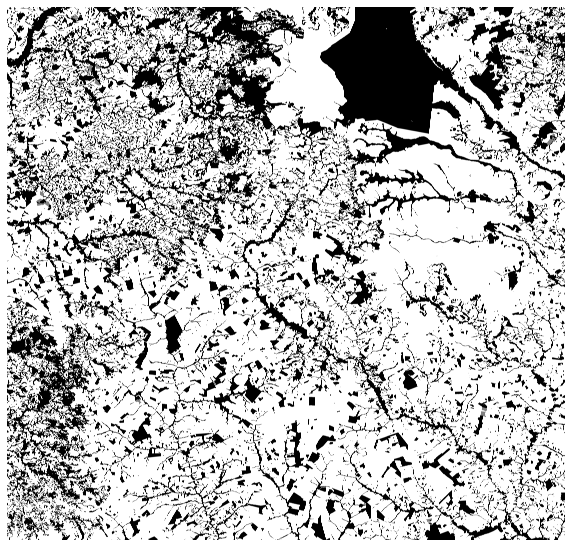

In [18]:
manager.logger.plotFigure(manager.label_mask, 
    name='image_stack_first_channel', cmap=plt.cm.gray, savefig=False, figsize=(10,10))

In [19]:

# Creating tile mask
manager.createTrainValTestTiles()


Tiles size:  3721 3896
Mask size:  (18605, 19480)


In [20]:
def get_pixel_count_set(label, mask, set_id):
    label_set = label[mask == set_id]
    return np.unique(label_set, return_counts=True)


In [21]:

np.unique(manager.mask_tiles)
for set_id in np.unique(manager.mask_tiles):
    print('Set', set_id, get_pixel_count_set(manager.label_mask, manager.mask_tiles, set_id))


Set 1 (array([0, 1, 2], dtype=uint8), array([4870897,  107548, 9518571], dtype=int64))
Set 2 (array([0, 1, 2], dtype=uint8), array([5863739,   42735, 8590542], dtype=int64))
Set 3 (array([0, 1, 2], dtype=uint8), array([5043217,     380, 9453419], dtype=int64))
Set 4 (array([0, 1, 2], dtype=uint8), array([11586786,      524,  2909706], dtype=int64))
Set 5 (array([0, 1, 2], dtype=uint8), array([5102453,    8953, 9385610], dtype=int64))
Set 6 (array([0, 1, 2], dtype=uint8), array([ 4079965,    73003, 10344048], dtype=int64))
Set 7 (array([0, 1, 2], dtype=uint8), array([4678683,   19973, 9798360], dtype=int64))
Set 8 (array([0, 1, 2], dtype=uint8), array([ 3810754,    20163, 10666099], dtype=int64))
Set 9 (array([0, 1, 2], dtype=uint8), array([ 4360787,     7117, 10129112], dtype=int64))
Set 10 (array([0, 1, 2], dtype=uint8), array([ 2962032,    40216, 11494768], dtype=int64))
Set 11 (array([0, 1, 2], dtype=uint8), array([ 3461781,    13658, 11021577], dtype=int64))
Set 12 (array([0, 1, 2]

In [22]:

manager.label_mask.dtype

dtype('uint8')

In [23]:

manager.getLabelCurrentDeforestation()

In [24]:

manager.loadInputImage()

ic| dataset.py:651 in loadInputImage()
    image_stack.shape: (18605, 19481, 9)


Image shape:  (18605, 19481, 9)
mask:  (18605, 19480)
image stack:  (18605, 19480, 9)
ref : (18605, 19480, 1)


In [25]:
if config['drop_no_data_pixels'] == True:
    manager.maskNoDataAsNotConsideredClass()

In [26]:
manager.dataset.previewBandsSnip

[[1, 2, 3], [5, 6, 7]]

In [27]:
condition = np.squeeze(np.zeros_like(manager.label_mask))


In [28]:
condition.shape

(18605, 19480)

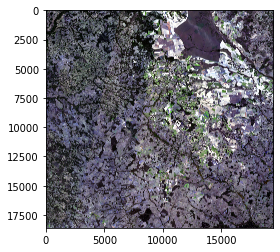

In [29]:
plt.imshow(manager.image_stack[...,[3,2,1]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


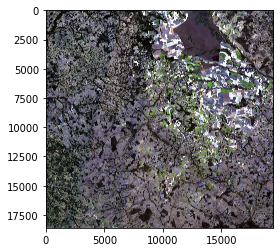

In [30]:
plt.imshow(manager.image_stack[...,[7,6,5]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


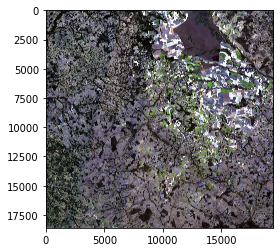

In [31]:
plt.imshow(manager.image_stack[...,[7,6,5]])

In [32]:

np.unique(manager.image_stack[...,0], return_counts=True)

(array([0.        , 0.05263158, 0.10526316, 0.15789473, 0.21052632,
        0.2631579 , 0.31578946, 0.36842105, 0.42105263, 0.5263158 ,
        0.6315789 , 0.7368421 , 0.84210527, 0.94736844, 1.        ],
       dtype=float32),
 array([ 99662188,    560438,    316161,    440417,    310884,    701575,
           318766,    903906,   1003651,   1305903,   2096238,   3824633,
          6540581,   8716969, 235723090], dtype=int64))

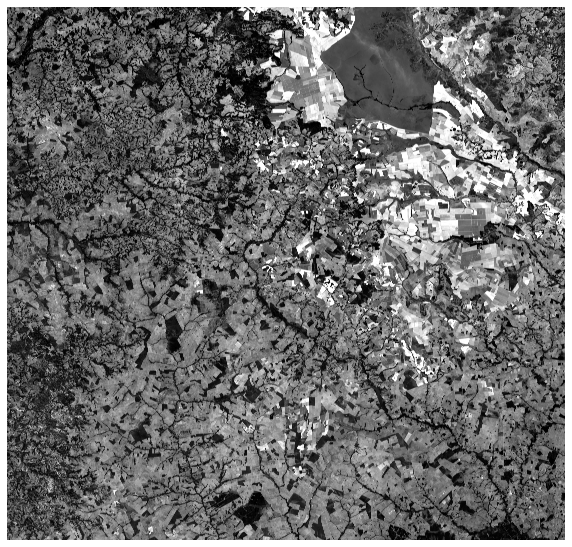

In [33]:

manager.logger.plotFigure(manager.image_stack[...,1], 
    name='image_stack_first_channel', cmap=plt.cm.gray, savefig=False, figsize=(10,10))

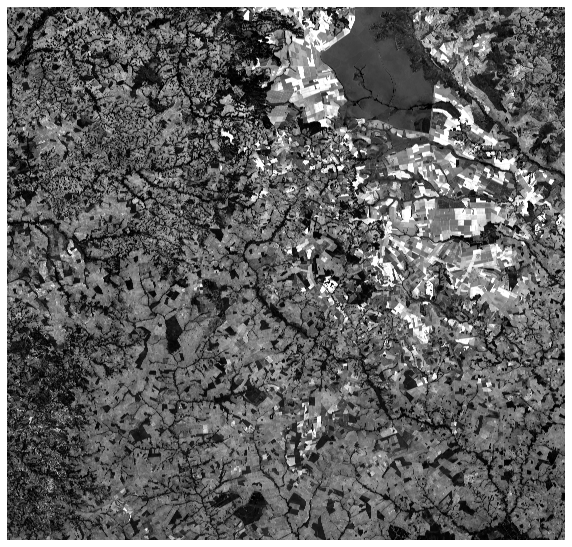

In [34]:

manager.logger.plotFigure(manager.image_stack[...,5], 
    name='image_stack_first_channel', cmap=plt.cm.gray, savefig=False, figsize=(10,10))

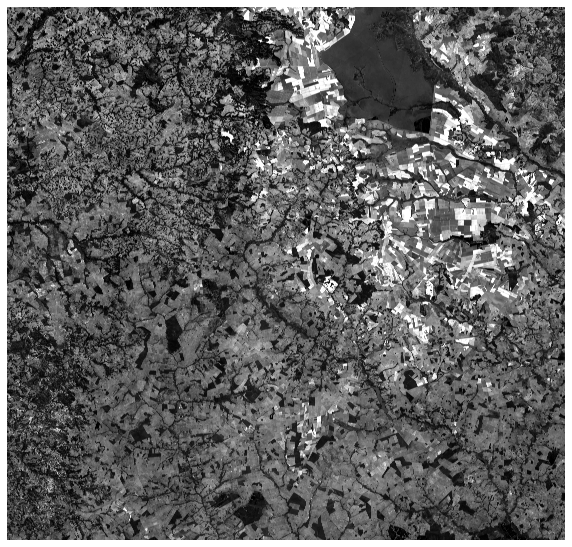

In [35]:

manager.logger.plotFigure(manager.image_stack[...,-3], 
    name='image_stack_first_channel', cmap=plt.cm.gray, savefig=False, figsize=(10,10))

In [36]:
def save_georreferenced(im, original_im_path, produced_im_path, bands = 1, plot = False):
    if len(im.shape) == 2:
        pad_values = ((0, 0), (0, 1))
    else:
        pad_values = ((0, 0), (0, 1), (0, 0))
    im_pad = np.pad(im, pad_values)
    print("im_pad.shape", im_pad.shape)

    if plot == True:
        fig, ax = plt.subplots(figsize=(10,10))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(im_pad, cmap='jet')
        plt.axis('off')

    if len(im_pad.shape) == 2:
        im_pad = np.expand_dims(im_pad, axis=0)
    else:
        im_pad = np.transpose(im_pad, (2, 0, 1))
    print("im_pad.shape", im_pad.shape)

    rasterTools.GeoReference_Raster_from_Source_data(original_im_path, 
                    im_pad.astype(np.float32), produced_im_path, bands = bands,
                    nodata=-1)
    del im_pad

In [37]:
import utils_v1
import rasterio

if config['georreferenced_save'] == True:
    # georref_im = utils_v1.load_tiff_image('D:/Jorge/datasets/sentinel2/MT_2019/S2_R1_MT_2019_08_02_2019_08_05_B3_B4.tif')
    original_im_path = os.path.join(manager.dataset.paths.optical_im_past_dates[dates[1]], 
        manager.dataset.paths.im_filenames[dates[1]][0])
    print("path",original_im_path)
    georref_im = utils_v1.load_tiff_image(original_im_path)

    print("georref_im.shape", georref_im.shape)

    del georref_im

In [38]:
if config['georreferenced_save'] == True:

    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_sentinel2_{}_rgb_georreferenced.tif'.format(
        manager.dataset.site, dates[0])
    print(produced_im_path)
    bands = manager.dataset.previewBandsSnip[0]
    save_georreferenced(manager.image_stack[...,bands], original_im_path, produced_im_path, bands = 3)

    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_sentinel2_{}_rgb_georreferenced.tif'.format(
        manager.dataset.site, dates[1])
    print(produced_im_path)
    bands = manager.dataset.previewBandsSnip[1]
    save_georreferenced(manager.image_stack[...,bands], original_im_path, produced_im_path, bands = 3)


In [39]:
np.unique(manager.label_mask, return_counts=True)

(array([0, 1, 2], dtype=uint8),
 array([ 99008239,    506597, 262910564], dtype=int64))

In [40]:
# manager.maskNoDataAsNotConsideredClass()

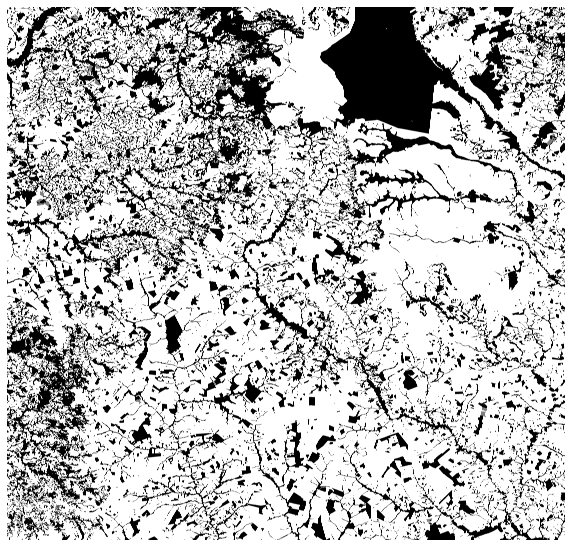

In [41]:

manager.logger.plotFigure(manager.label_mask, 
    name='label_mask', cmap=plt.cm.gray, savefig=False, figsize=(10,10))

In [42]:

manager.getImageChannels()

ic| base.py:150 in getImageChannels()
    self.image_stack.shape: (18605, 19480, 9)
ic| base.py:152 in getImageChannels()- self.channels: 9


In [43]:

manager.getTrainValTestMasks()

Training tiles:  [2, 4, 5, 6, 7, 12, 14, 15, 18, 21, 23, 24]
Validation tiles:  [9, 11, 25]
Test tiles:  [1, 3, 8, 10, 13, 16, 17, 19, 20, 22]


In [44]:
if config['use_entire_image_as_training'] == True:
    manager.mask_train_val[manager.mask_train_val == 0] = 1 # convert all test areas to train
    manager.mask_test[manager.mask_test == 1] = 0 # convert all test areas to train

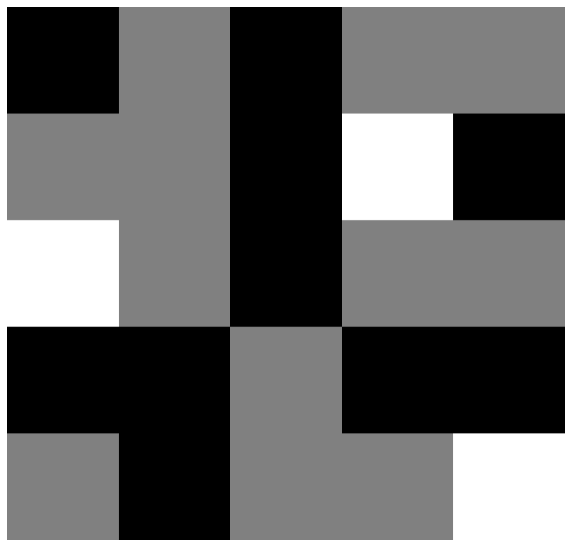

In [45]:
manager.logger.plotFigure(manager.mask_train_val, 
    name='image_stack_first_channel', cmap=plt.cm.gray, savefig=False, figsize=(10,10))


In [46]:

train_unique = get_pixel_count_set(manager.label_mask, manager.mask_train_val, 1)
val_unique = get_pixel_count_set(manager.label_mask, manager.mask_train_val, 2)
test_unique = get_pixel_count_set(manager.label_mask, manager.mask_train_val, 0)

total_unique = np.unique(manager.label_mask, return_counts=True)

In [47]:
print("train unique", train_unique)
print("val unique", val_unique)
print("test unique", test_unique)

print("total unique", total_unique)


train unique (array([0, 1, 2], dtype=uint8), array([ 51670884,    190363, 122102945], dtype=int64))
val unique (array([0, 1, 2], dtype=uint8), array([10755724,    20775, 32714549], dtype=int64))
test unique (array([0, 1, 2], dtype=uint8), array([ 36581631,    295459, 108093070], dtype=int64))
total unique (array([0, 1, 2], dtype=uint8), array([ 99008239,    506597, 262910564], dtype=int64))


In [48]:
print("train unique percentage", np.round(train_unique[1]/np.sum(train_unique[1]), 4))
print("val unique", np.round(val_unique[1]/np.sum(val_unique[1]), 4))
print("test unique", np.round(test_unique[1]/np.sum(test_unique[1]), 4))
print("total unique", np.round(total_unique[1]/np.sum(total_unique[1]) * 100, 1))


train unique percentage [0.297  0.0011 0.7019]
val unique [2.473e-01 5.000e-04 7.522e-01]
test unique [0.2523 0.002  0.7456]
total unique [27.3  0.1 72.5]


In [49]:

if config["training"] == True:
    # Extracting patches from the idx matrix
    manager.createIdxImage()


In [50]:
if config["training"] == True:
    manager.extractCoords()

In [51]:
if config["training"] == True:
    manager.trainTestSplit()

In [52]:
if config["training"] == True:
    manager.label_mask.shape

In [53]:
if config["training"] == True:

    manager.logger.plotFigure(manager.label_mask[...,-1], 
        name='Reference', cmap=plt.cm.gray, savefig=False)



In [54]:
if config["training"] == True:
    np.unique(manager.label_mask)

In [55]:
if config["training"] == True:
    print(manager.coords_train)

In [56]:
if config["training"] == True:
    manager.retrieveSamplesOfInterest()

In [57]:
if config["training"] == True:
    inputSnipShow = True

In [58]:
# count, unique = np.unique(label_mask, return_counts=True)
# print(count, unique)
# print(unique[1]/unique[0])

In [59]:
'''
count, unique = np.unique(label_mask[mask_test == 1], return_counts=True)
print(count, unique)
print(unique[1]/unique[0])
'''

'\ncount, unique = np.unique(label_mask[mask_test == 1], return_counts=True)\nprint(count, unique)\nprint(unique[1]/unique[0])\n'

In [60]:
'''
count, unique = np.unique(label_mask[mask_train_val == 1], return_counts=True)
print(count, unique)
print(unique[1]/unique[0])
'''

'\ncount, unique = np.unique(label_mask[mask_train_val == 1], return_counts=True)\nprint(count, unique)\nprint(unique[1]/unique[0])\n'

In [61]:
manager.dataset.image_channels

[[0, 1, 2, 3, 4, 5, 6, 7, 8]]

In [62]:
manager.dataset.bands

4

In [63]:
manager.dataset.previewBandsSnip

[[1, 2, 3], [5, 6, 7]]

In [64]:
if config["training"] == True:
    if inputSnipShow == True:
        manager.snipDataset(idx = 1000)


In [65]:
if config["training"] == True:
    if inputSnipShow == True:
        manager.snipDataset(idx = 97)


In [66]:
if config["training"] == True:
    if inputSnipShow == True:

        manager.snipDataset(idx = 300)

In [67]:
if config["training"] == True:
    if inputSnipShow == True:

        manager.snipDataset(idx = 400)

In [68]:
if config["training"] == True:
    if inputSnipShow == True:

        manager.snipDataset(idx = 400)

In [69]:
if config["training"] == True:
    manager.getGenerators()


In [70]:
if config["training"] == True:
    manager.fixChannelNumber()

In [71]:
if config["training"] == True:
    print(manager.path_exp)

In [72]:
if config["training"] == True:
    print(manager.channels)

In [73]:
if config["training"] == True:
    print(manager.image_stack.shape)

In [74]:
if config["training"] == True:
    print("config['training_times']", config["training_times"])

In [75]:
manager.class_n

3

In [76]:
measured_training_time = []
if config["training"] == True:
    for tm in range(config['training_times']):
        t = time.time()
        manager.repetition_id = tm
        manager.train()
        measured_training_time.append(time.time() - t)

In [77]:
print("measured_training_time", measured_training_time)
print("np.sum(np.array(measured_training_time))", np.sum(np.array(measured_training_time)))
print("np.mean(np.array(measured_training_time))", np.mean(np.array(measured_training_time)))

measured_training_time []
np.sum(np.array(measured_training_time)) 0.0
np.mean(np.array(measured_training_time)) nan


c:\Users\jchamorro\Anaconda3\envs\tf2\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\jchamorro\Anaconda3\envs\tf2\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [78]:
if config["training"] == True:
    manager.plotHistory()


In [79]:
if config["inferring"] != True:
    sys.exit()
else:
    manager.repetition_id = repetition_id

In [80]:
manager.image_stack.shape

(18605, 19480, 9)

In [81]:
manager.patchesHandler.dataset.image_channels[-1]

[0, 1, 2, 3, 4, 5, 6, 7, 8]

In [82]:
if issubclass(type(dataset), MultipleDates):
	manager.channels = manager.patchesHandler.input_image_shape
	manager.image_stack = manager.image_stack[..., manager.patchesHandler.dataset.image_channels[-1]]
	manager.label_mask = manager.label_mask[...,-1]


In [83]:
manager.image_stack.shape

(18605, 19480, 9)

In [84]:
manager.setPadding()

-35.0 -8.0


In [85]:
import src.network as network
from tensorflow.keras.models import Model, load_model, Sequential
'''
def infer(self):

    self.h, self.w, self.c = self.image1_pad.shape
    self.c = self.channels
    patch_size_rows = self.h//self.n_rows
    patch_size_cols = self.w//self.n_cols
    num_patches_x = int(self.h/patch_size_rows)
    num_patches_y = int(self.w/patch_size_cols)

    ic(self.path_models+ '/' + self.method +'_'+str(self.repetition_id)+'.h5')
    model = load_model(self.path_models+ '/' + self.method +'_'+str(self.repetition_id)+'.h5', compile=False)
    
    if self.classes_mode == False:
        class_n = 3
        self.patchesHandler.class_n = class_n
    else:
        class_n = 2    
        self.patchesHandler.class_n = class_n + 1
    if self.config["loadInference"] == False:
        if self.config["save_probabilities"] == False:
            if self.classes_mode == False:
                self.prob_rec = np.zeros((self.image1_pad.shape[0],self.image1_pad.shape[1], self.config["inference_times"]), dtype = np.float32)
            else:
                self.prob_rec = np.zeros((self.image1_pad.shape[0],self.image1_pad.shape[1], class_n, self.config["inference_times"]), dtype = np.float32)

            # self.prob_rec = np.zeros((image1_pad.shape[0],image1_pad.shape[1], class_n, self.config["inference_times"]), dtype = np.float32)
        print("Dropout training mode: {}".format(self.config['dropout_training']))
        new_model = network.build_resunet_dropout_spatial(input_shape=(patch_size_rows,patch_size_cols, self.c), 
            nb_filters = self.nb_filters, n_classes = class_n, dropout_seed = None, training=self.config['dropout_training'])

        for l in range(1, len(model.layers)):
            new_model.layers[l].set_weights(model.layers[l].get_weights())
        
        

        metrics_all =[]
        with tf.device('/cpu:0'):
            for tm in range(0,self.config["inference_times"]):

                print('time: ', tm)

                
                # Recinstructing predicted map
                start_test = time.time()
                
                prob_reconstructed = self.patchesHandler.infer(
                        new_model, self.image1_pad, self.h, self.w, 
                        num_patches_x, num_patches_y, patch_size_rows, 
                        patch_size_cols, classes_mode = self.classes_mode)
                        
                ts_time =  time.time() - start_test

                if self.config["save_probabilities"] == True:
                    np.save(self.path_maps+'/'+'prob_'+str(tm)+'.npy',prob_reconstructed) 
                else:
                    self.prob_rec[...,tm] = prob_reconstructed
                
                metrics_all.append(ts_time)
                del prob_reconstructed
            metrics_ = np.asarray(metrics_all)
            # Saving test time
            np.save(self.path_exp+'/metrics_ts.npy', metrics_)
    del self.image1_pad
'''

'\ndef infer(self):\n\n    self.h, self.w, self.c = self.image1_pad.shape\n    self.c = self.channels\n    patch_size_rows = self.h//self.n_rows\n    patch_size_cols = self.w//self.n_cols\n    num_patches_x = int(self.h/patch_size_rows)\n    num_patches_y = int(self.w/patch_size_cols)\n\n    ic(self.path_models+ \'/\' + self.method +\'_\'+str(self.repetition_id)+\'.h5\')\n    model = load_model(self.path_models+ \'/\' + self.method +\'_\'+str(self.repetition_id)+\'.h5\', compile=False)\n    \n    if self.classes_mode == False:\n        class_n = 3\n        self.patchesHandler.class_n = class_n\n    else:\n        class_n = 2    \n        self.patchesHandler.class_n = class_n + 1\n    if self.config["loadInference"] == False:\n        if self.config["save_probabilities"] == False:\n            if self.classes_mode == False:\n                self.prob_rec = np.zeros((self.image1_pad.shape[0],self.image1_pad.shape[1], self.config["inference_times"]), dtype = np.float32)\n            else:

In [86]:
'''
import types

manager.infer = types.MethodType(infer, manager)
'''


'\nimport types\n\nmanager.infer = types.MethodType(infer, manager)\n'

In [87]:
repetition_id

0

In [88]:
manager.infer()

ic| base.py:332 in infer()
    self.path_models+ '/' + self.method +'_'+str(self.repetition_id)+'.h5': 'D:/Jorge/datasets/deforestation/experiments/MS/exp37/models/resunet_0.h5'


Dropout training mode: False
time:  0
runtime_repetition 117.23
Inference runtime 117.62


In [89]:
manager.loadPredictedProbabilities()

In [90]:
manager.prob_rec.shape

(18640, 19488, 1)

In [91]:
'''
if useLessInferenceRuns == True:
    ic(reducedInferenceRuns)

    prob_rec_all = prob_rec.copy()
    prob_rec = prob_rec_all[:reducedInferenceRuns]
    prob_rec = np.transpose(np.squeeze(prob_rec), (1, 2, 0))
'''

'\nif useLessInferenceRuns == True:\n    ic(reducedInferenceRuns)\n\n    prob_rec_all = prob_rec.copy()\n    prob_rec = prob_rec_all[:reducedInferenceRuns]\n    prob_rec = np.transpose(np.squeeze(prob_rec), (1, 2, 0))\n'

In [92]:
manager.prob_rec.shape

(18640, 19488, 1)

In [93]:
manager.getMeanProb()

In [94]:
manager.logger.getStats(manager.mean_prob)

ic| Logger.py:123 in getStats()
    np.min(value): 2.0506048e-11
    np.mean(value): 0.002045102
    np.max(value): 1.0


In [95]:
ic(manager.mean_prob.shape)

ic| 3703776524.py:1 in <cell line: 1>()
    manager.mean_prob.shape: (18640, 19488)


(18640, 19488)

In [96]:
manager.unpadMeanProb()

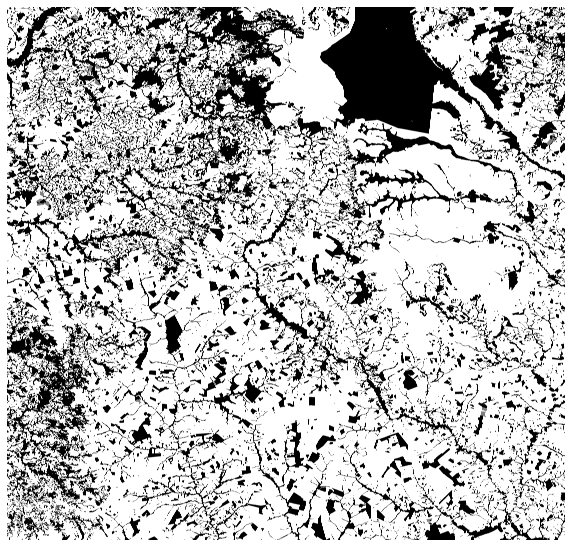

In [97]:
manager.logger.plotFigure(manager.label_mask, 
            name='Reference mask', figsize=(10,10), cmap=plt.cm.gray, savefig=True)

In [98]:
manager.squeezeLabel()

In [99]:
manager.setMeanProbNotConsideredAreas()
# manager.logger.plotFigure(manager.mean_prob, 
#             name='Mean predicted probability', figsize=(10,10), cmap='jet', savefig=False)

In [100]:
print(manager.label_mask.shape)

(18605, 19480)


In [101]:
# manager.getLabelTest()

In [102]:
# manager.getMAP()

In [103]:
manager.prob_rec.shape

(18640, 19488, 1)

In [104]:
manager.preprocessProbRec()
print(manager.prob_rec.shape)

(1, 18640, 19488, 1)


In [105]:
manager.prob_rec.shape

(1, 18640, 19488, 1)

In [106]:
manager.logger.getStats(manager.prob_rec)

ic| Logger.py:123 in getStats()
    np.min(value): 2.0506048e-11
    np.mean(value): 0.002045102
    np.max(value): 1.0


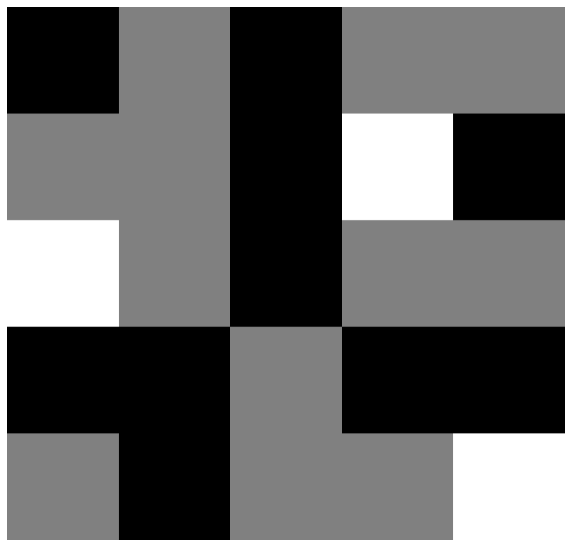

In [107]:
manager.logger.plotFigure(manager.mask_train_val, 
            name=manager.dataset.site + manager.title_name + ' Train val mask.png', figsize=(10,10), savefig=False)

In [108]:
manager.getLabelCurrentDeforestation()

In [109]:
manager.applyProbabilityThreshold()

(18605, 19480)
Single entropy
(array([0., 1.], dtype=float32), array([362004223,    421177], dtype=int64))


ic| base.py:468 in applyProbabilityThreshold()
    self.predicted_unpad.shape: (18605, 19480)
    self.predicted.shape: (18605, 19480)


In [110]:
manager.getTestValues()

ic| base.py:491 in getTestValues()- predicted_test.shape: (144970160,)
ic| base.py:500 in getTestValues()- predicted_test.shape: (36877090,)


In [111]:
manager.removeSmallPolygons()

ic| metrics.py:213 in removeSmallPolygonsForMetrics()
    np.unique(predicted, return_counts=True): (array([0., 1.], dtype=float32), array([362034636,    390764], dtype=int64))
    np.unique(predicted_larger_than_min_area, return_counts=True): (array([0., 1.], dtype=float32), array([362058863,    366537], dtype=int64))
ic| metrics.py:215 in removeSmallPolygonsForMetrics()
    np.unique(ignored_polygons, return_counts=True): (array([0., 1.], dtype=float32), array([362401173,     24227], dtype=int64))


In [112]:
manager.calculateMetrics()

ic| base.py:544 in calculateMetrics()
    self.f1: 82.82
    self.precision: 96.72
    self.recall: 72.41


In [113]:
manager.getValidationValuesForMetrics()
manager.calculateMetricsValidation()

ic| base.py:473 in getValidationValuesForMetrics()
    self.label_mask_val.shape: (43491048,)
ic| base.py:479 in getValidationValuesForMetrics()
    self.label_mask_val_valid.shape: (10774447,)
ic| base.py:555 in calculateMetricsValidation()
    f1_val: 55.03
    precision_val: 77.78
    recall_val: 42.57
    mAP_val: 44.68


In [114]:
calculateMAPWithoutSmallPolygons = False
if calculateMAPWithoutSmallPolygons == True:
    manager.calculateMAPWithoutSmallPolygons()

In [115]:
manager.get_label_no_buffer()

D:/Jorge/datasets/deforestation/MS/deforestation_past_years.tif
Loaded deforestation past years


ic| dataset.py:708 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Label where deforestation past years is actual date (2020) = 1


ic| dataset.py:711 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation different from 0 (no deforestation)


ic| dataset.py:715 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation before 2008 is 2
D:/Jorge/datasets/deforestation/MS/deforestation_before_2000_MS.tif


ic| dataset.py:719 in loadLabelFromDate()
    np.unique(label_past_deforestation_before_2008, return_counts=True): (array([  0, 208], dtype=uint8), array([126708038, 235735967], dtype=int64))
ic| dataset.py:721 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))
ic| dataset.py:700 in loadLabel()
    label_per_date.shape: (18605, 19481, 1)


In [116]:
manager.getErrorMask()

(array([0., 1.], dtype=float32), array([362232440,    192960], dtype=int64))


In [117]:
manager.getErrorMaskToShowRGB()

[0. 1.]


In [118]:

def plotFigure(figure, name='output/figure', cmap = plt.cm.gray, 
                savefig=False, figsize=(10,10), dpi=200, axis_off = True):
    plt.figure(figsize=figsize)
    plt.imshow(figure, cmap=cmap)

    # title_name = 'ResUnet'
    if axis_off == True:
        plt.axis('off')
    if savefig == True:
        plt.savefig('output/figures/' + name, dpi=dpi, bbox_inches='tight')


In [119]:
'''
import types

manager.setUncertainty = types.MethodType(setUncertainty, manager)
'''


'\nimport types\n\nmanager.setUncertainty = types.MethodType(setUncertainty, manager)\n'

In [120]:
manager.config['uncertainty_method']

'pred_entropy_single'

In [121]:
manager.config['site']

'MS'

In [122]:
manager.config['uncertainty_method'] = "pred_entropy"


In [123]:
print(np.min(manager.prob_rec), np.mean(manager.prob_rec), np.max(manager.prob_rec))
print(np.std(manager.prob_rec))
print(manager.prob_rec.shape)

2.0506048e-11 0.002045102 1.0
0.033246856
(1, 18640, 19488, 1)


In [124]:
manager.setUncertainty()

pred_mean 2.0506048e-11 0.002045102 1.0
K = 1, pred_mean shape (18640, 19488, 1)


In [125]:
print(np.min(manager.uncertainty_map), np.mean(manager.uncertainty_map), np.max(manager.uncertainty_map))

-0.0 0.0024627286 0.36787948


In [126]:
# manager.uncertainty_map[manager.uncertainty_map>1] = 1

In [127]:
manager.logger.getStats(manager.uncertainty_map)

ic| Logger.py:123 in getStats()
    np.min(value): -0.0
    np.mean(value): 0.0024627286
    np.max(value): 0.36787948


In [128]:
manager.getUncertaintyToShow()
manager.logger.getStats(manager.uncertainty_to_show)


ic| Logger.py:123 in getStats()
    np.min(value): 0.0
    np.mean(value): 0.0021917103
    np.max(value): 0.36787948


ic| 3983861654.py:8 in <cell line: 8>()
    manager.uncertainty_to_show.shape: (18605, 19480)


fig_name MSResUnet uncertainty pred_entropy.png


(18605, 19480)

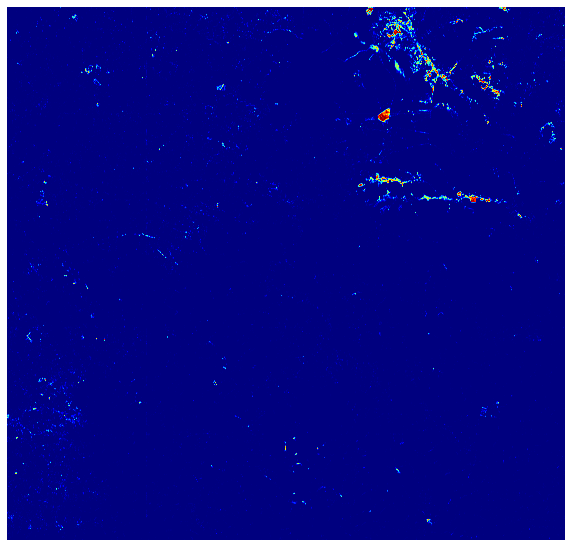

In [129]:
fig_name = manager.dataset.site + manager.title_name + ' uncertainty '+manager.config['uncertainty_method']+'.png'
# manager.logger.
plotFigure(manager.uncertainty_to_show, 
            name=fig_name, 
            figsize=(10,10), cmap='jet', savefig=True,
            dpi=500)
print("fig_name", fig_name)
ic(manager.uncertainty_to_show.shape)



In [130]:
'''
import src.uncertainty
fig, ax = plt.subplots(1,1,figsize=(10,10))
src.uncertainty.show_im(manager.uncertainty_map, ax, title = 'Uncertainty predictive entropy')

plt.savefig('output/figures/Para' + manager.title_name + ' uncertainty '+manager.config['uncertainty_method']+'.png', 
    dpi=150, bbox_inches='tight')
'''

"\nimport src.uncertainty\nfig, ax = plt.subplots(1,1,figsize=(10,10))\nsrc.uncertainty.show_im(manager.uncertainty_map, ax, title = 'Uncertainty predictive entropy')\n\nplt.savefig('output/figures/Para' + manager.title_name + ' uncertainty '+manager.config['uncertainty_method']+'.png', \n    dpi=150, bbox_inches='tight')\n"

fig_name output/figures/MSResUnet uncertainty pred_entropy_bar.png


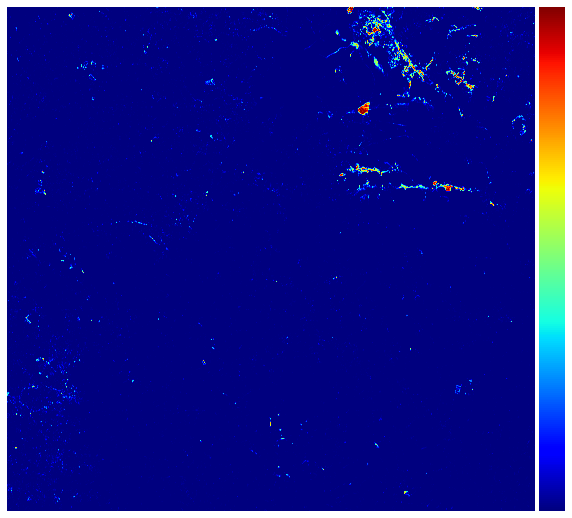

In [131]:

from mpl_toolkits.axes_grid1 import make_axes_locatable

def show_im(im, ax, title = "", cmap = "jet"):
    im_plt = ax.imshow(im.astype(np.float32), cmap = cmap)
    # plt.title(title)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im_plt, cax=cax) 
    ax.set_axis_off()
    plt.xticks(visible=False)
    plt.yticks(visible=False)

import src.uncertainty
fig, ax = plt.subplots(1,1,figsize=(10,10))
# src.uncertainty.show_im(manager.uncertainty_to_show, ax, title = 'Uncertainty predictive entropy')
show_im(manager.uncertainty_to_show, ax, title = 'Uncertainty predictive entropy')


fig_name = 'output/figures/' + manager.dataset.site + manager.title_name + ' uncertainty '+manager.config['uncertainty_method']+'_bar.png'
plt.axis('off')
plt.savefig(fig_name, 
    dpi=500, bbox_inches='tight')
print("fig_name", fig_name)

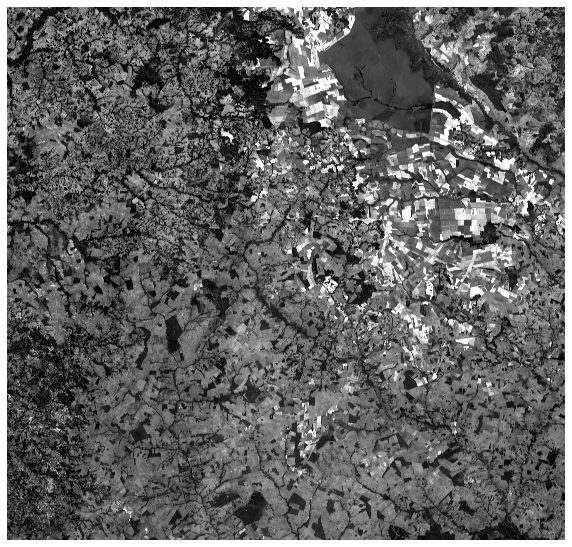

In [132]:

manager.logger.plotFigure(manager.image_stack[...,7], 
    name='image_stack_first_channel', cmap=plt.cm.gray, savefig=False, figsize=(10,10))

In [133]:
np.unique(manager.mask_train_val, return_counts=True)

(array([0, 1, 2], dtype=uint8),
 array([144970160, 173964192,  43491048], dtype=int64))

In [134]:
manager.error_mask.shape

(18605, 19480)

In [135]:
manager.npad

((0, 35), (0, 8), (0, 0))

In [136]:
manager.getValidationValues2()
manager.getTestValues2()

ic| base.py:595 in getTestValues2()
    self.label_mask.shape: (18605, 19480)
ic| base.py:596 in getTestValues2()
    self.mask_test.shape: (18605, 19480)
ic| base.py:600 in getTestValues2()
    self.label_mask_test.shape: (144970160,)
ic| base.py:608 in getTestValues2()
    self.error_mask_test.shape: (36864191,)


In [137]:
config["plotLandsat"] = True

In [138]:
# manager.logger.plotCropSample(manager)

In [139]:
# if config["plotLandsat"] == True:
label_tmp_dates = []
for date in dataset.prodes_dates:
    label_tmp_date = dataset.loadLabelFromDate(date)
    label_tmp_date = label_tmp_date[:manager.mask_tiles.shape[0], :manager.mask_tiles.shape[1]]
    label_tmp_dates.append(label_tmp_date)

D:/Jorge/datasets/deforestation/MS/deforestation_past_years.tif
Loaded deforestation past years


ic| dataset.py:708 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Label where deforestation past years is actual date (2019) = 1


ic| dataset.py:711 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation different from 0 (no deforestation)


ic| dataset.py:715 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation before 2008 is 2
D:/Jorge/datasets/deforestation/MS/deforestation_before_2000_MS.tif


ic| dataset.py:719 in loadLabelFromDate()
    np.unique(label_past_deforestation_before_2008, return_counts=True): (array([  0, 208], dtype=uint8), array([126708038, 235735967], dtype=int64))
ic| dataset.py:721 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


D:/Jorge/datasets/deforestation/MS/deforestation_past_years.tif
Loaded deforestation past years


ic| dataset.py:708 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Label where deforestation past years is actual date (2020) = 1


ic| dataset.py:711 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation different from 0 (no deforestation)


ic| dataset.py:715 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation before 2008 is 2
D:/Jorge/datasets/deforestation/MS/deforestation_before_2000_MS.tif


ic| dataset.py:719 in loadLabelFromDate()
    np.unique(label_past_deforestation_before_2008, return_counts=True): (array([  0, 208], dtype=uint8), array([126708038, 235735967], dtype=int64))
ic| dataset.py:721 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


D:/Jorge/datasets/deforestation/MS/deforestation_past_years.tif
Loaded deforestation past years


ic| dataset.py:708 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Label where deforestation past years is actual date (2021) = 1


ic| dataset.py:711 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation different from 0 (no deforestation)


ic| dataset.py:715 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


Past deforestation before 2008 is 2
D:/Jorge/datasets/deforestation/MS/deforestation_before_2000_MS.tif


ic| dataset.py:719 in loadLabelFromDate()
    np.unique(label_past_deforestation_before_2008, return_counts=True): (array([  0, 208], dtype=uint8), array([126708038, 235735967], dtype=int64))
ic| dataset.py:721 in loadLabelFromDate()
    np.unique(deforestation_past_years, return_counts=True): (array([   0, 2002, 2004, 2006, 2008, 2010, 2012, 2013, 2014, 2015, 2016,
                                                                    2017, 2018, 2019, 2020, 2021], dtype=uint16),
                                                              array([334024764,   8717093,   6541094,   3824922,   2096535,   1305948,
                                                                      1003721,    903906,    318788,    701575,    310887,    440417,
                                                                       316180,    560438,    600838,    776899], dtype=int64))


In [140]:
if config["plotLandsat"] == True:
    # del manager.image_stack
    import src.lansdatLoader as ll
    import importlib
    importlib.reload(ll)
    landsatLoader = ll.LandsatLoader(dataset,
                                    manager.mask_tiles.shape)
    # landsatLoader = ll.LandsatLoaderHistogramMatching(dataset, 
    #                                                   manager.mask_tiles.shape)

    
    ims = landsatLoader.load()


Loading D:/Jorge/datasets/landsat/MS/L8_MS_2019.tif
D:/Jorge/datasets/landsat/MS/L8_MS_2019.tif
np.nanmin(im), np.nanmean(im), np.nanmax(im) 0 29.377242308014488 255
Loading D:/Jorge/datasets/landsat/MS/L8_MS_2020.tif
D:/Jorge/datasets/landsat/MS/L8_MS_2020.tif
np.nanmin(im), np.nanmean(im), np.nanmax(im) 0 29.020522062094035 255
Loading D:/Jorge/datasets/landsat/MS/L8_MS_2021.tif
D:/Jorge/datasets/landsat/MS/L8_MS_2021.tif
np.nanmin(im), np.nanmean(im), np.nanmax(im) 0 31.691712394994674 255


In [141]:
if config["plotLandsat"] == True:
    for idx in range(len(ims)):
        ims[idx] = ims[idx][:manager.mask_tiles.shape[0], :manager.mask_tiles.shape[1],:]
        print(ims[idx].shape)
    print("ims.shape", ims[0].shape)
    print("manager.label_no_buffer.shape", manager.label_no_buffer.shape)
    # ims = landsatLoader.darken_past_deforestation(ims, manager.label_no_buffer)
    ims = landsatLoader.add_deforestation_edges_by_date(ims, label_tmp_dates[:])

(18605, 19480, 3)
(18605, 19480, 3)
(18605, 19480, 3)
ims.shape (18605, 19480, 3)
manager.label_no_buffer.shape (18605, 19480)


In [142]:
# ims[0].shape

In [143]:
# plt.figure(figsize=(10,10))
# plt.imshow(ims[0])

In [144]:

import src.Logger as lg
importlib.reload(lg)
logger = lg.Logger()
manager.logger = logger


In [145]:
if config["plotLandsat"] == False:
    import src.lansdatLoader as ll
    import importlib
    importlib.reload(ll)    
    landsatLoader = ll.LandsatLoader(dataset,
                                    manager.mask_tiles.shape)
    image_2021 = np.load(os.path.join(manager.dataset.paths.optical_im_past_dates[2021], 'optical_im.npy')).astype('float32')# [manager.dataset.lims[0]:manager.dataset.lims[1], manager.dataset.lims[2]:manager.dataset.lims[3]]

    ims = [manager.image_stack[...,manager.dataset.previewBandsSnip[0]],
           manager.image_stack[...,manager.dataset.previewBandsSnip[1]],
           image_2021[...,[0,1,2]]]
    for idx in range(len(ims)):
        ims[idx] = ims[idx][:manager.mask_tiles.shape[0], :manager.mask_tiles.shape[1],:]
        print(ims[idx].shape)    
    ims = landsatLoader.darken_past_deforestation(ims, manager.label_no_buffer)
    ims = landsatLoader.add_deforestation_edges_by_date(ims, label_tmp_dates[:])


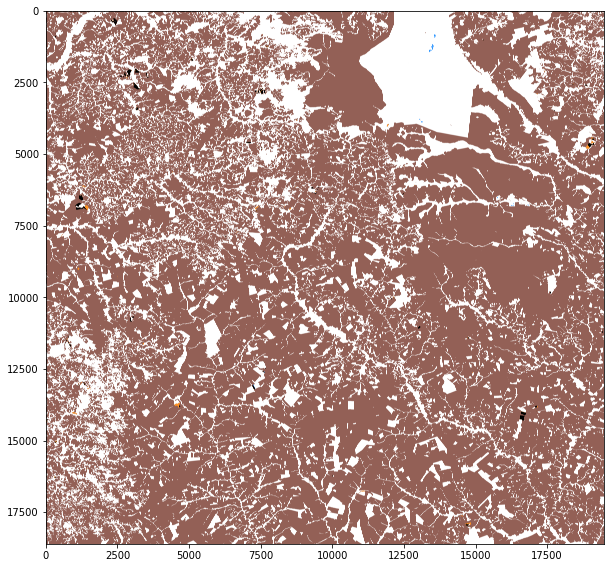

In [146]:

# manager.logger.
plotFigure(manager.error_mask_to_show_rgb[...,::-1], 
            name=manager.dataset.site + manager.title_name + ' error mask color.png', 
            figsize=(10,10), savefig=True, dpi=500, axis_off=False) # dpi=300

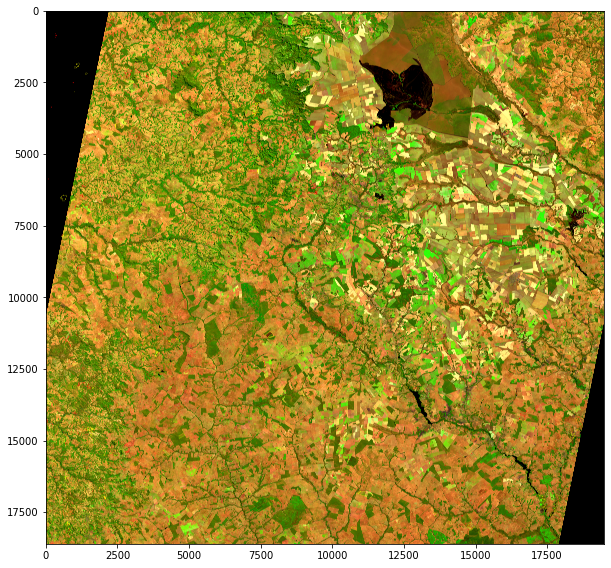

In [147]:
plotFigure(ims[2], 
            name=manager.dataset.site + manager.title_name + ' error mask color.png', 
            figsize=(10,10), savefig=True, dpi=500, axis_off=False) # dpi=300

ic| Logger.py:212 in plotCropSampleLandsat()
    manager.dataset.previewLims1: array([ 3500,  4500, 14000, 15000])
    manager.dataset.previewLims2: array([13600, 13900,  4450,  4750])
ic| Logger.py:214 in plotCropSampleLandsat()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([0], dtype=uint8)
ic| Logger.py:216 in plotCropSampleLandsat()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([90000], dtype=int64))


[(18605, 19480, 3), (18605, 19480, 3), (18605, 19480, 3), (18605, 19480), (18605, 19480, 3), (18605, 19480)]
manager.dataset.previewLims0 [ 3850  4150 11800 12100]
manager.dataset.previewLims1 [ 3500  4500 14000 15000]
manager.dataset.previewLims2 [13600 13900  4450  4750]
manager.dataset.previewLims3 [17770 18070 14600 14900]
manager.dataset.previewLims4 [ 6000  7000 15600 16600]
(300, 300, 3)
(1000, 1000, 3)
(300, 300, 3)
(300, 300, 3)
(1000, 1000, 3)
(300, 300, 3)


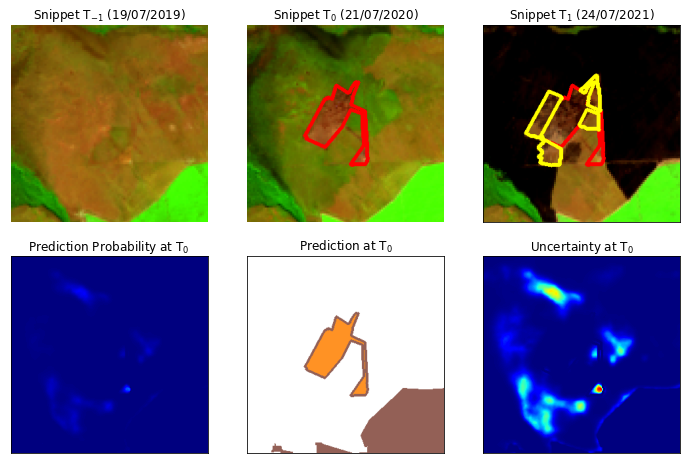

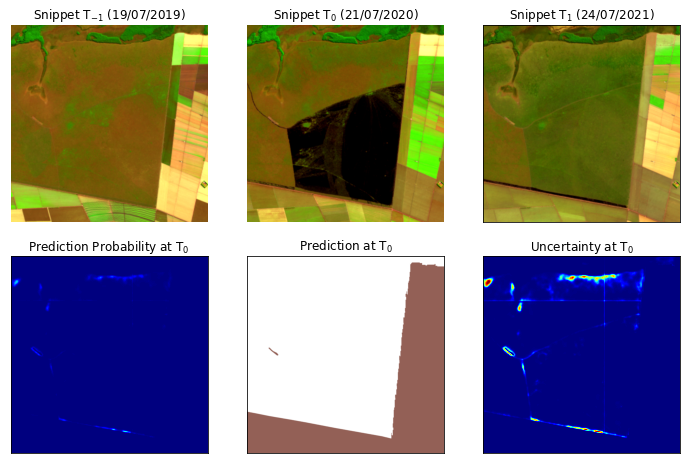

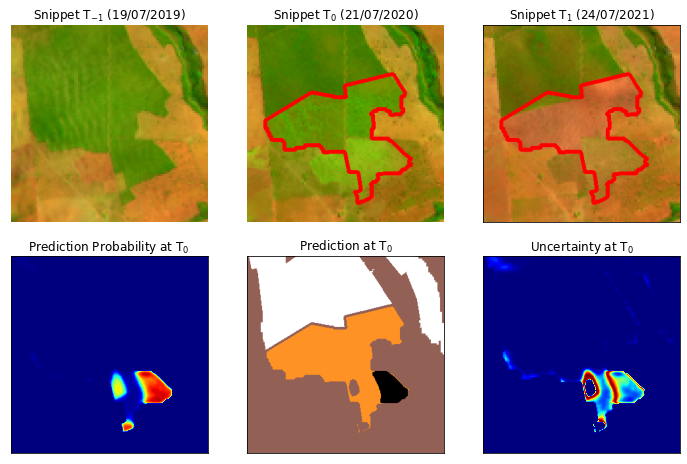

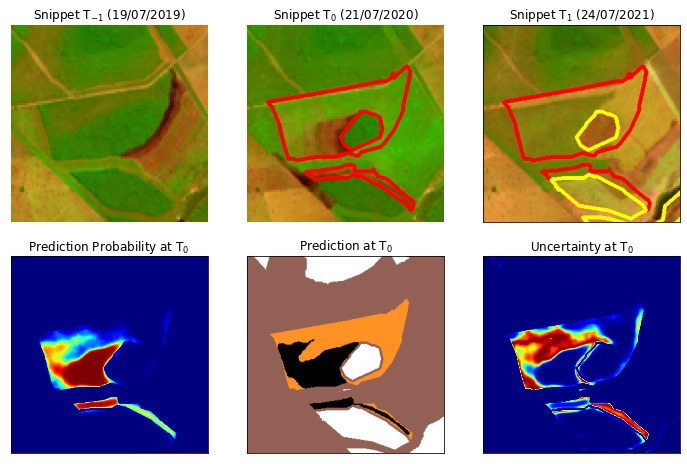

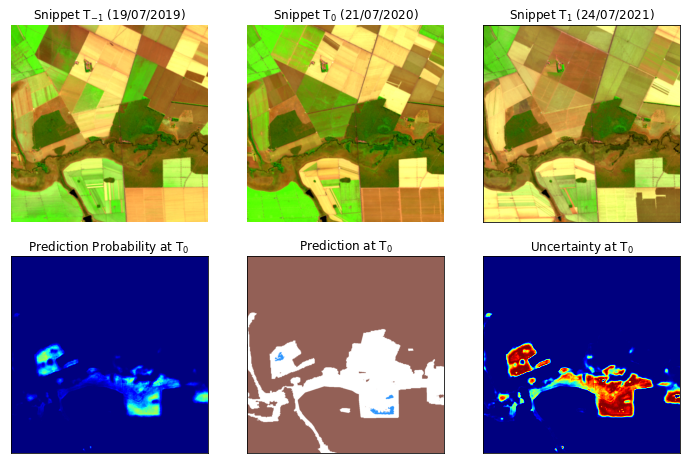

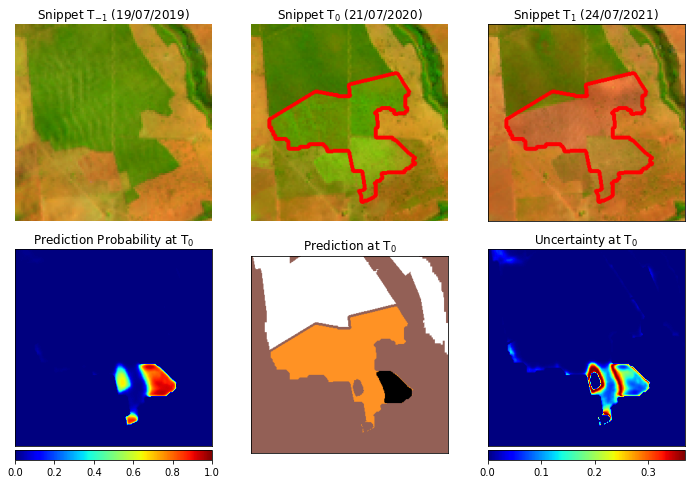

In [148]:
if config["plotLandsat"] == True:
 
    logger.plotCropSampleLandsat(manager, ims, show_polygon_text = False)

else:
    # MS
    manager.dataset.previewLims0 = np.array([3850, 4150, 11800, 12100])
    manager.dataset.previewLims1 = np.array([3500, 4500, 14000, 15000])
    manager.dataset.previewLims2 = np.array([13600, 13900, 4450, 4750])
    manager.dataset.previewLims3 = np.array([17770, 18070, 14600, 14900])

    # PI

    manager.dataset.previewLims0 = np.array([2600, 3300, 13450, 14150])
    manager.dataset.previewLims1 = np.array([1300, 2000, 11000, 11700])
    manager.dataset.previewLims2 = np.array([6300, 7300, 12200, 13200])    

    manager.dataset.previewLims3 = np.array([4300, 5300, 2600, 3600])  
    manager.dataset.previewLims4 = np.array([18355, 19355, 10600, 11600]) 
    manager.dataset.previewLims5 = np.array([6000, 6500, 14800, 15300])   

    # im_t2 = utils_v1.load_tiff_image()
    logger.plotCropSampleS2(manager, 
                            ims[0],
                            ims[1],
                            ims[2],
                            show_polygon_text = False)


In [188]:
print(manager.dataset.previewLims0)
print(manager.dataset.previewLims1)
print(manager.dataset.previewLims2)
print(manager.dataset.previewLims3)
print(manager.dataset.previewLims4)


[ 3850  4150 11800 12100]
[13250 14250  4000  5000]
[13500 14500 16250 17250]
[17770 18070 14600 14900]
[ 6000  7000 15600 16600]


In [149]:
manager.dataset.previewLims0[1] - manager.dataset.previewLims0[0]

300

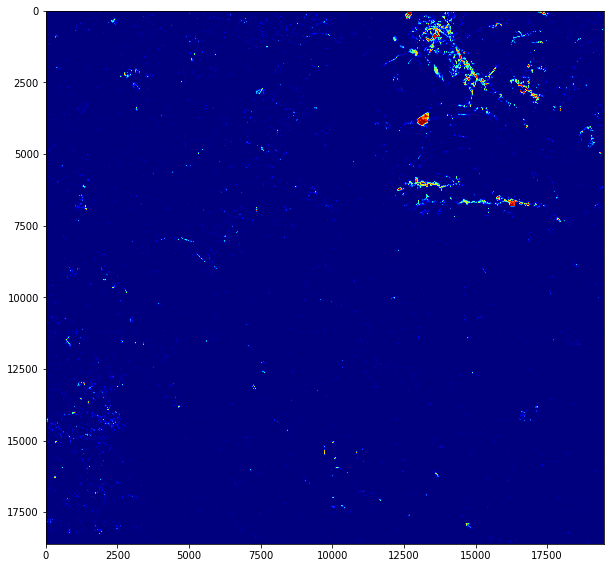

In [150]:
plt.figure(figsize=(10, 10))
plt.imshow(manager.uncertainty_to_show, cmap = 'jet')


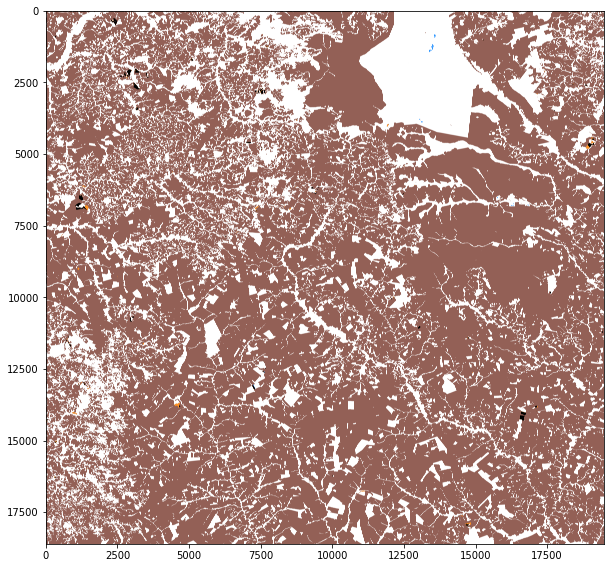

In [151]:
plt.figure(figsize=(10, 10))
plt.imshow(manager.error_mask_to_show_rgb[...,::-1])


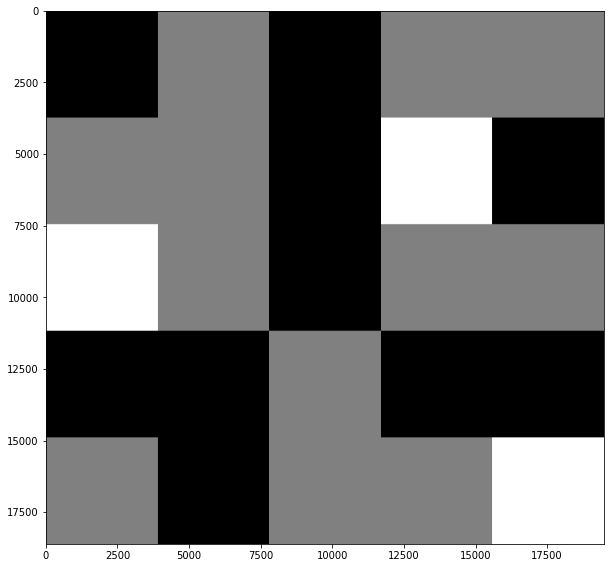

In [152]:
plt.figure(figsize=(10, 10))
plt.imshow(manager.mask_train_val, cmap='gray')

In [153]:
manager.mask_train_val.shape

(18605, 19480)

In [154]:
if config['site'] == 'PI':
    manager.dataset.previewLims1 = np.array([2000, 3000, 1500, 2500])
    # manager.dataset.previewLims2 = np.array([6300, 7300, 10000, 11000])
    manager.dataset.previewLims2 = np.array([2200, 3200, 9000, 10000])
elif config['site'] == 'MS':
    manager.dataset.previewLims1 = np.array([13250, 14250, 4000, 5000])
    # manager.dataset.previewLims2 = np.array([6300, 7300, 10000, 11000])
    manager.dataset.previewLims2 = np.array([13500, 14500, 16250, 17250])


ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| Logger.py:467 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([1000000], dtype=int64))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| Logger.py:467 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([1000000], dtype=int64))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| 

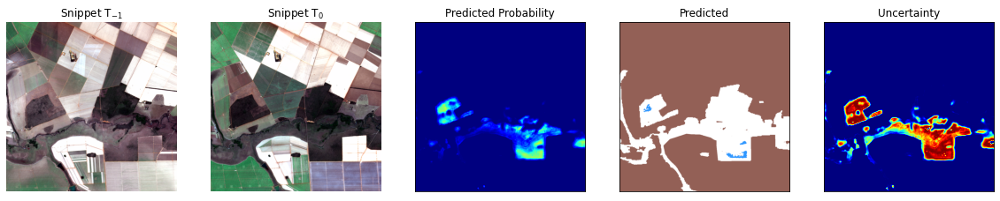

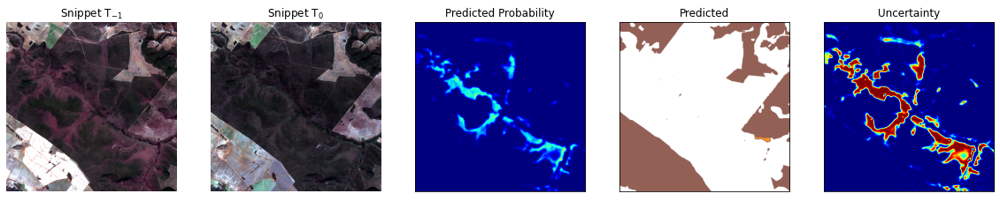

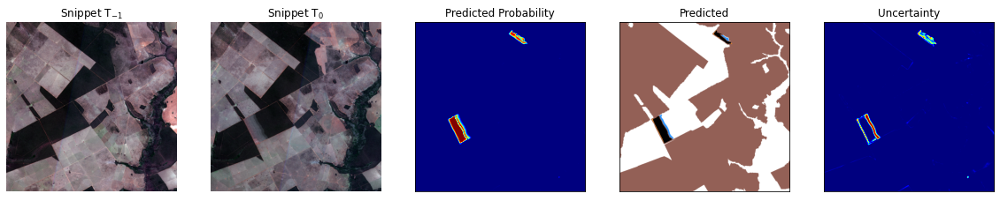

In [155]:

if config['site'] == 'MS':
    previewLims0 = np.array([6000, 7000, 15600, 16600])
    manager.logger.plotCropSampleT0T1(manager, previewLims0, save_name='0')
    previewLims3 = np.array([2200, 3200, 16300, 17300])
    manager.logger.plotCropSampleT0T1(manager, previewLims3, save_name='3')
    previewLims4 = np.array([12500, 13500, 7000, 8000])    
    manager.logger.plotCropSampleT0T1(manager, previewLims4, save_name='4')

elif config['site'] == 'PI':

    manager.dataset.previewLims1 = np.array([18355, 19355, 10600, 11600])



ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| Logger.py:467 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([1000000], dtype=int64))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| Logger.py:467 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([1000000], dtype=int64))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| 

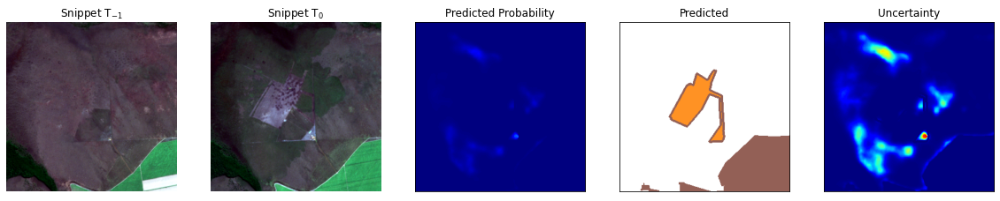

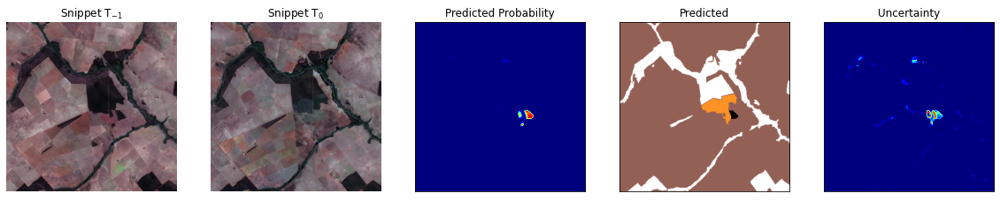

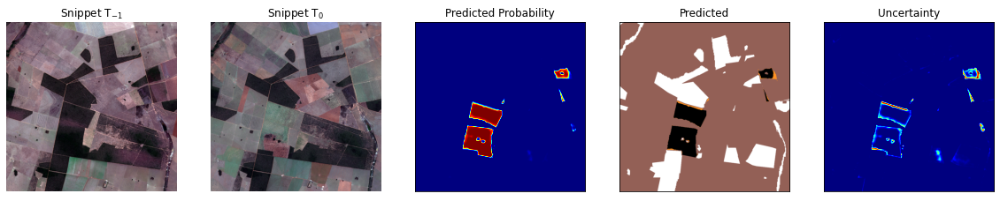

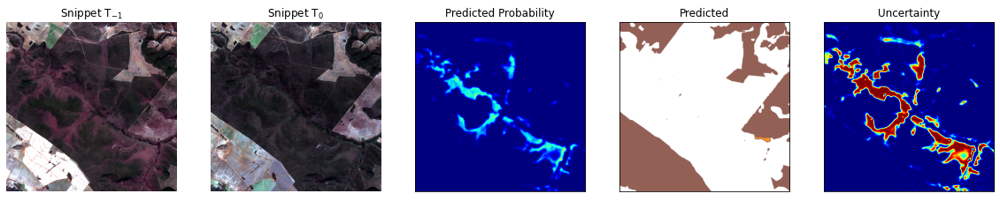

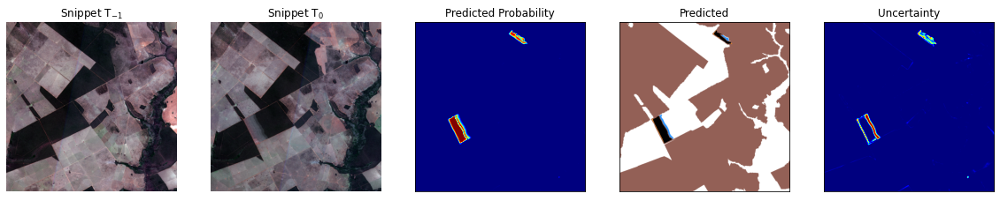

In [156]:

if config['site'] == 'MS':
    manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims0, save_name='0')
    manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims1, save_name='1')
    manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims2, save_name='2')
    # manager.logger.plotCropSampleT0T1(manager, previewLims0, save_name='5')
    manager.logger.plotCropSampleT0T1(manager, previewLims3, save_name='3')
    manager.logger.plotCropSampleT0T1(manager, previewLims4, save_name='4')

elif config['site'] == 'PI':

    manager.dataset.previewLims1 = np.array([18355, 19355, 10600, 11600])



In [157]:
import gc
gc.collect()

56781

In [158]:
if config['site'] == 'PI':

    manager.dataset.previewLims2 = np.array([100, 1100, 7700, 8700])


In [159]:
if config['site'] == 'PI':
    previewLims0 = np.array([6000, 7000, 14500, 15500])    

    manager.logger.plotCropSampleT0T1(manager, previewLims0, save_name='0')


In [160]:
if config['site'] == 'PI':
    previewLims3 = np.array([12000, 13000, 13000, 14000])    

    manager.logger.plotCropSampleT0T1(manager, previewLims3, save_name='3')


In [161]:
if config['site'] == 'PI':
    previewLims4 = np.array([4300, 5300, 2600, 3600])    

    manager.logger.plotCropSampleT0T1(manager, previewLims4, save_name='4')


ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| Logger.py:467 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([1000000], dtype=int64))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| Logger.py:467 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]], return_counts=True): (array([1], dtype=uint8), array([1000000], dtype=int64))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
ic| Logger.py:465 in plotCropSampleT0T1()
    np.unique(manager.mask_test[lims[0]:lims[1], lims[2]:lims[3]]): array([1], dtype=uint8)
ic| 

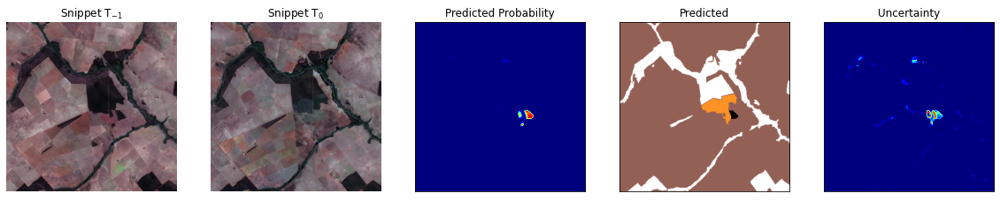

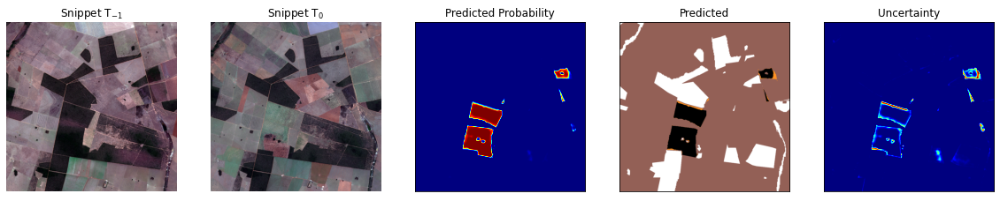

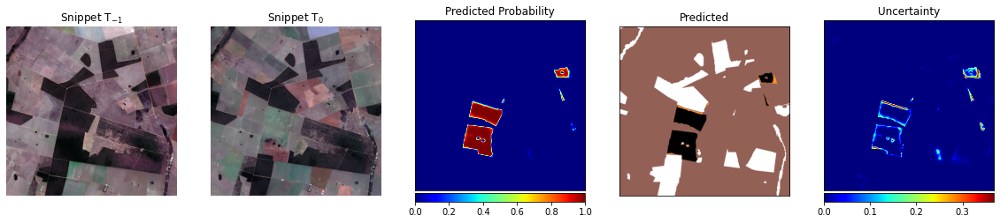

In [162]:
'''
manager.dataset.previewLims1 = np.array([2500, 5000, 15000, 17500])
manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims1, save_name='0')
manager.dataset.previewLims1 = np.array([12500, 15000, 2500, 5000])
manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims1, save_name='1')
manager.dataset.previewLims1 = np.array([15000, 17500, 2000, 3000])
manager.dataset.previewLims1 = np.array([5000, 7500, 15000, 17500])

manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims1, save_name='2')
'''


manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims1, save_name='1')
manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims2, save_name='2')

manager.logger.plotCropSampleT0T1(manager, manager.dataset.previewLims2, colorbar=True, save_name='Colorbar')

In [163]:
manager.logger.getStats(manager.uncertainty)


ic| Logger.py:123 in getStats()
    np.min(value): -0.0
    np.mean(value): 0.0048832158
    np.max(value): 0.36787948


In [164]:
'''
manager.getOtherUncertaintyMetrics()
print(manager.sUEO)

print(manager.ece_score)  
'''

'\nmanager.getOtherUncertaintyMetrics()\nprint(manager.sUEO)\n\nprint(manager.ece_score)  \n'

In [165]:
if config["plotPOI"] == True and config['site'] == 'PA':

    print(manager.mean_prob.shape)
    font = {'family': "Times New Roman",
            'color':  'white',
            'weight': 'bold',
            'size': 24,
            }

    lims = dataset.previewLims1
    im = manager.uncertainty_map[lims[0]:lims[1], lims[2]:lims[3]]
    plt.figure(figsize=(10,10))
    plt.imshow(im, cmap='jet')

    letters = ['A', 'B', 'C', 'D', 'E', 'F']

    for poi_id in range(4):
            
            plt.text(manager.dataset.snippet_coords['snippet_id0'][poi_id][1], 
                    manager.dataset.snippet_coords['snippet_id0'][poi_id][0], 
                    letters[poi_id], fontdict=font)
    plt.axis('off')

    plt.savefig(os.path.join('output/pdf_plot_results', 
                            'pdf_plot_poi0.png'), 
    dpi=150, bbox_inches='tight')

    lims = dataset.previewLims2
    im = manager.uncertainty_map[lims[0]:lims[1], lims[2]:lims[3]]
    plt.figure(figsize=(10,10))
    plt.imshow(im, cmap='jet')

    letters = ['E', 'F']

    print(manager.dataset.snippet_coords['snippet_id1'])
    for poi_id in range(2):
            
            plt.text(manager.dataset.snippet_coords['snippet_id1'][poi_id][1], 
                    manager.dataset.snippet_coords['snippet_id1'][poi_id][0], 
                    letters[poi_id], fontdict=font)
    plt.axis('off')
            
    plt.savefig(os.path.join('output/pdf_plot_results', 
                            'pdf_plot_poi1.png'), 
    dpi=150, bbox_inches='tight')

In [166]:
if config["plotPOI"] == True and config['site'] == 'PA':
    manager.getPOIValues()


In [167]:

if config["plotPOI"] == True and config['site'] == 'PA':
    import pickle
    with open('output/log/log_ensemble_.pkl', 'wb') as f:
                pickle.dump(manager.snippet_poi_results, f)


In [168]:
from scipy import optimize  

manager.getOptimalUncertaintyThreshold(bounds=(np.min(manager.uncertainty) + 0.000015, np.max(manager.uncertainty) - 0.0015))

ic| base.py:845 in getOptimalUncertaintyThreshold()
    bounds: (1.5e-05, 0.3663794801235199)
c:\Users\jchamorro\Anaconda3\envs\tf2\lib\site-packages\scipy\optimize\_minimize.py:783: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  warn("Method 'bounded' does not support relative tolerance in x; "


0.13995377913649928
threshold 0.13995377913649928


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (349805,)
    predicted_test_high_uncertainty.shape: (349805,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 349805
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 349805
    len(label_mask_current_deforestation_test): 36864191


[0.99458726 0.80454675 0.57116663 0.00948902 0.87712586 0.52720486
 0.11628896]
0.22644070098702052
threshold 0.22644070098702052


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (212831,)
    predicted_test_high_uncertainty.shape: (212831,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 212831
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 212831
    len(label_mask_current_deforestation_test): 36864191


[0.99267176 0.80211238 0.64294271 0.00577338 0.80398602 0.40896211
 0.15117524]
0.08650192185052122
threshold 0.08650192185052122


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (517122,)
    predicted_test_high_uncertainty.shape: (517122,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 517122
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 517122
    len(label_mask_current_deforestation_test): 36864191


[0.99555837 0.80432928 0.51040965 0.01402776 0.90567686 0.58476698
 0.09003192]
0.053466857285978074
threshold 0.053466857285978074


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (739142,)
    predicted_test_high_uncertainty.shape: (739142,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 739142
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 739142
    len(label_mask_current_deforestation_test): 36864191


[0.99612397 0.80313718 0.46404909 0.02005041 0.91963095 0.6159274
 0.06854979]
0.033050064564543166
threshold 0.033050064564543166


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1027254,)
    predicted_test_high_uncertainty.shape: (1027254,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1027254
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1027254
    len(label_mask_current_deforestation_test): 36864191


[0.99665437 0.80015685 0.42761795 0.0278659  0.92772757 0.63679054
 0.05200218]
0.020431792721434923
threshold 0.020431792721434923


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1414021,)
    predicted_test_high_uncertainty.shape: (1414021,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1414021
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1414021
    len(label_mask_current_deforestation_test): 36864191


[0.99720237 0.79676825 0.3971277  0.03835758 0.93316587 0.65188146
 0.03928311]
0.036040648453599285
threshold 0.036040648453599285


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (968942,)
    predicted_test_high_uncertainty.shape: (968942,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 968942
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 968942
    len(label_mask_current_deforestation_test): 36864191


[0.99654049 0.80065134 0.43361472 0.0262841  0.92655185 0.63365484
 0.05466242]
0.030506785789568527
threshold 0.030506785789568527


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1083989,)
    predicted_test_high_uncertainty.shape: (1083989,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1083989
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1083989
    len(label_mask_current_deforestation_test): 36864191


[0.99671736 0.79964797 0.42206475 0.02940493 0.92883227 0.63964437
 0.04965169]
0.026658480873961075
threshold 0.026658480873961075


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1186516,)
    predicted_test_high_uncertainty.shape: (1186516,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1186516
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1186516
    len(label_mask_current_deforestation_test): 36864191


[0.99689122 0.79870266 0.41326693 0.03218614 0.93042487 0.644103
 0.04588615]
0.029879819725234624
threshold 0.029879819725234624


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1099160,)
    predicted_test_high_uncertainty.shape: (1099160,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1099160
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1099160
    len(label_mask_current_deforestation_test): 36864191


[0.99676539 0.79951295 0.42081789 0.02981647 0.92903454 0.64029111
 0.04905091]
0.028649377773328672
threshold 0.028649377773328672


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1130787,)
    predicted_test_high_uncertainty.shape: (1130787,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1130787
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1130787
    len(label_mask_current_deforestation_test): 36864191


[0.99677613 0.7991598  0.41790508 0.0306744  0.92962272 0.64181705
 0.04784778]
0.029615668386734524
threshold 0.029615668386734524


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1105828,)
    predicted_test_high_uncertainty.shape: (1105828,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1105828
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1105828
    len(label_mask_current_deforestation_test): 36864191


[0.99676056 0.79943784 0.42018923 0.02999735 0.92917094 0.64062166
 0.04879171]
0.029246578215423473
threshold 0.029246578215423473


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1115206,)
    predicted_test_high_uncertainty.shape: (1115206,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1115206
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1115206
    len(label_mask_current_deforestation_test): 36864191


[0.9967623  0.79932095 0.41934053 0.03025174 0.92934435 0.64107971
 0.04842896]
0.02958233461412984
threshold 0.02958233461412984


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1106698,)
    predicted_test_high_uncertainty.shape: (1106698,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1106698
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1106698
    len(label_mask_current_deforestation_test): 36864191


[0.99675997 0.7994404  0.42011239 0.03002095 0.92918757 0.64065157
 0.04875992]
0.029665184615582655
threshold 0.029665184615582655


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1104607,)
    predicted_test_high_uncertainty.shape: (1104607,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1104607
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1104607
    len(label_mask_current_deforestation_test): 36864191
ic| base.py:849 in getOptimalUncertaintyThreshold()
    self.threshold_optimal: 0.029615668386734524


[0.99676174 0.79946991 0.4203429  0.02996423 0.92913764 0.6405288
 0.04883957]


In [169]:
manager.getUncertaintyMetricsFromOptimalThreshold()

threshold:  0.029615668386734524
threshold 0.029615668386734524


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1105828,)
    predicted_test_high_uncertainty.shape: (1105828,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1105828
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1105828
    len(label_mask_current_deforestation_test): 36864191


[0.99676056 0.79943784 0.42018923 0.02999735 0.92917094 0.64062166
 0.04879171]
threshold 0.029615668386734524
(36864191,) (36864191,)


ic| base.py:880 in getUncertaintyMetricsFromOptimalThreshold()
    self.m_optimal: {'AA': array([0.02999735]),
                     'UEO': array([0.04879171]),
                     'f1': 82.82,
                     'f1_H': array([0.75837666]),
                     'f1_L': array([0.88726069]),
                     'precision_H': array([0.92917094]),
                     'precision_L': array([0.99676056]),
                     'recall_H': array([0.64062166]),
                     'recall_L': array([0.79943784]),
                     'recall_Ltotal': array([0.42018923])}
ic| base.py:881 in getUncertaintyMetricsFromOptimalThreshold()
    self.m_audited_optimal: {'f1': array([0.94367873]),
                             'precision': array([0.99847581]),
                             'recall': array([0.89458335])}


cm_audited [[36577479      391]
 [   30183   256138]]
[0.99847581 0.89458335]


{'metrics': {'precision_L': array([0.99676056]),
  'recall_L': array([0.79943784]),
  'recall_Ltotal': array([0.42018923]),
  'AA': array([0.02999735]),
  'precision_H': array([0.92917094]),
  'recall_H': array([0.64062166]),
  'UEO': array([0.04879171]),
  'f1_L': array([0.88726069]),
  'f1_H': array([0.75837666]),
  'f1': 82.82},
 'metrics_audited': {'precision': array([0.99847581]),
  'recall': array([0.89458335]),
  'f1': array([0.94367873])},
 'exp': 37}

In [170]:
manager.threshold_optimal

0.029615668386734524

In [171]:
'''
print(manager.uncertainty.shape)
print(manager.label_mask_current_deforestation_test.shape)
print(manager.predicted_test.shape)
'''

'\nprint(manager.uncertainty.shape)\nprint(manager.label_mask_current_deforestation_test.shape)\nprint(manager.predicted_test.shape)\n'

In [172]:
# error_test = np.abs(manager.label_mask_current_deforestation_test - manager.predicted_test)

In [173]:
# np.unique(error_test, return_counts=True)

In [174]:
'''
error_test_str = np.array(error_test, dtype=np.str)
error_test_str[error_test == 0] = 'Correct'
error_test_str[error_test == 1] = 'Error'
'''

"\nerror_test_str = np.array(error_test, dtype=np.str)\nerror_test_str[error_test == 0] = 'Correct'\nerror_test_str[error_test == 1] = 'Error'\n"

In [175]:
'''
import seaborn as sns
penguins = sns.load_dataset("penguins")

sns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde", fill=True)
'''

'\nimport seaborn as sns\npenguins = sns.load_dataset("penguins")\n\nsns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde", fill=True)\n'

In [176]:
'''
import pandas as pd
df = pd.DataFrame({'uncertainty': manager.uncertainty.flatten(), 
                    'label': manager.label_mask_current_deforestation_test.flatten(),
                    'error_test': error_test_str.flatten()})
'''

"\nimport pandas as pd\ndf = pd.DataFrame({'uncertainty': manager.uncertainty.flatten(), \n                    'label': manager.label_mask_current_deforestation_test.flatten(),\n                    'error_test': error_test_str.flatten()})\n"

In [177]:
# df

In [178]:
# np.max(df['uncertainty'])

In [179]:
# g = sns.histplot(df.sample(1000), x="uncertainty", hue="error_test", kind='hist', stat='density')


In [180]:
from src import metrics as _metrics

def getUncertaintyAAValues(self):



    # self.threshold_list = [0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.25, 0.27, 0.3, 0.34, 0.36]

    # self.threshold_list = [0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.25, 0.27, 0.3, 0.34, 0.36, np.max(uncertainty)-0.003]
    if self.config['uncertainty_method'] == "pred_entropy_single":
        self.threshold_list = [0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                            0.25, 0.27, 0.3, 0.34, 0.36, np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]
    if self.config['uncertainty_method'] == "pred_entropy":
            if self.classes_mode == False:
                # self.threshold_list = [0.0025, 0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                #            0.25, 0.27, 0.3, 0.34, 0.36, np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]
                self.threshold_list = [0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                        0.25, 0.27, 0.3, 0.34, 0.36, np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]                            
                    # self.threshold_list = [0.0025, 0.025, 0.05, 0.1, 0.2, 0.4, 
                    #         0.5, 0.6, 0.7, 0.8, 0.9, np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]
            else:
                    self.threshold_list = [0.0025, 0.025, 0.05, 0.075, 0.1, 0.2, 0.4, 
                    0.5, 0.6, 0.7, 0.8, 0.9, np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]
                    
                    # self.threshold_list = [0.13, 0.15, 0.2, 0.225, 
                    # 0.25, 0.27, 0.3, 0.34, 0.36, 0.45, 0.55, 0.65, 0.8]
    elif self.config['uncertainty_method'] == "pred_var":
            self.threshold_list = [0.0025, 0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36]
            self.threshold_list = [x*0.13/0.36 for x in self.threshold_list] + [np.max(self.uncertainty)-0.0015, np.max(self.uncertainty)-0.0008]
            self.threshold_list = np.linspace(np.min(self.uncertainty) + 0.000015, np.max(self.uncertainty) - 0.0015, 19)
            self.threshold_list = [8e-05, 1.5e-04, 1.5e-03] + \
                list(np.linspace(np.min(self.uncertainty) + 0.000015, np.max(self.uncertainty) - 0.0015, 19))
            self.threshold_list.insert(0, self.threshold_list.pop(3))

            # self.threshold_list = np.linspace(np.min(self.uncertainty) + 0.00000015, np.max(self.uncertainty) - 0.0015, 19)
            # self.threshold_list = np.logspace(np.min(self.uncertainty) + 0.00000015, np.max(self.uncertainty) - 0.0015, 19)

    elif self.config['uncertainty_method'] == "MI":
            self.threshold_list = [0.0025, 0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36]
            self.threshold_list = [x*0.235/0.36 for x in self.threshold_list] + [np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]
            self.threshold_list = [0.00001, 0.0005, 0.0001] + [x*0.235/0.36 for x in self.threshold_list] + [np.max(self.uncertainty)-0.003, np.max(self.uncertainty)-0.0015]
    elif self.config['uncertainty_method'] == "KL":
            self.threshold_list = [0.0025, 0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36]
            self.threshold_list = [x*1.0/0.36 for x in self.threshold_list] + [np.max(self.uncertainty)-0.006, np.max(self.uncertainty)-0.003]
    elif self.config['uncertainty_method'] == "evidential":
            # self.threshold_list = [0.015, 0.03, 0.04]
            self.threshold_list = [0.0025, 0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36]
            self.threshold_list = [ 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36]
            self.threshold_list = [ 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36, 0.45, 0.55, 0.65, 0.8]

            self.threshold_list = [0.13, 0.15, 0.2, 0.225, 
                    0.25, 0.27, 0.3, 0.34, 0.36, 0.45, 0.55, 0.65, 0.8]

            # self.threshold_list = [ 0.15, 0.2,  
            #          0.3, 0.35, 0.4, 0.5, 0.6, 0.7]

            # self.threshold_list = [0.015,0.1, 0.2, 0.27, 0.36, 0.45, 0.55, 0.65]

            # self.threshold_list = [x*1.0/0.36 for x in self.threshold_list] + [np.max(uncertainty)-0.006, np.max(uncertainty)-0.003]
                    
            # self.threshold_list = np.linspace(np.min(uncertainty) + 0.0015, np.max(uncertainty) - 0.0015, 19)
    print(self.threshold_list)
    self.loadThresholdMetrics = False
    if self.loadThresholdMetrics == False:
            # self.threshold_list = [0.1]
            # y_test
            ic(self.uncertainty.shape, self.label_mask_current_deforestation_test.shape)

            metrics_values = _metrics.getAA_Recall(self.uncertainty, 
                    self.label_mask_current_deforestation_test, 
                    self.predicted_test, self.threshold_list)

            # ic(metrics_values)


    self.m = {'precision_L': metrics_values[:,0],
            'recall_L': metrics_values[:,1],
            'recall_Ltotal': metrics_values[:,2],
            'AA': metrics_values[:,3],
            'precision_H': metrics_values[:,4],
            'recall_H': metrics_values[:,5],
            'UEO': metrics_values[:,6]}

    self.m['f1_L'] = 2*self.m['precision_L']*self.m['recall_L']/(self.m['precision_L']+self.m['recall_L'])
    self.m['f1_H'] = 2*self.m['precision_H']*self.m['recall_H']/(self.m['precision_H']+self.m['recall_H'])


In [181]:
manager.config['uncertainty_method']

'pred_entropy'

In [182]:
# manager.threshold_list

In [183]:


# manager.threshold_list.insert(0, manager.threshold_list.pop(3))

In [184]:

import types

manager.getUncertaintyAAValues = types.MethodType(getUncertaintyAAValues, manager)



Get precision-recall threshold

In [185]:

manager.getUncertaintyAAValues()

ic| 642846373.py:73 in getUncertaintyAAValues()
    self.uncertainty.shape: (36864191,)
    self.label_mask_current_deforestation_test.shape: (36864191,)


[0.005, 0.0075, 0.01, 0.015, 0.025, 0.05, 0.08, 0.1, 0.15, 0.2, 0.225, 0.25, 0.27, 0.3, 0.34, 0.36, 0.3648794801235199, 0.3663794801235199]
threshold 0.005


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (3372481,)
    predicted_test_high_uncertainty.shape: (3372481,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 3372481
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 3372481
    len(label_mask_current_deforestation_test): 36864191


[0.99930426 0.78444075 0.32607109 0.09148393 0.94245051 0.68116912
 0.01774498]
threshold 0.0075


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (2652491,)
    predicted_test_high_uncertainty.shape: (2652491,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 2652491
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 2652491
    len(label_mask_current_deforestation_test): 36864191


[0.99870078 0.78769854 0.34364577 0.07195305 0.94046293 0.67487563
 0.02216161]
threshold 0.01


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (2228677,)
    predicted_test_high_uncertainty.shape: (2228677,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 2228677
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 2228677
    len(label_mask_current_deforestation_test): 36864191


[0.99826165 0.78975508 0.3570049  0.06045642 0.93884879 0.66993008
 0.02598815]
threshold 0.015


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1726351,)
    predicted_test_high_uncertainty.shape: (1726351,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1726351
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1726351
    len(label_mask_current_deforestation_test): 36864191


[0.99764721 0.79425043 0.37912343 0.04683003 0.93587326 0.66002673
 0.03285126]
threshold 0.025


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (1238580,)
    predicted_test_high_uncertainty.shape: (1238580,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1238580
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 1238580
    len(label_mask_current_deforestation_test): 36864191


[0.99700622 0.79833964 0.4094181  0.03359846 0.93105372 0.64594042
 0.04419086]
threshold 0.05


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (774926,)
    predicted_test_high_uncertainty.shape: (774926,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 774926
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 774926
    len(label_mask_current_deforestation_test): 36864191


[0.9961808  0.80274107 0.45822696 0.0210211  0.92109626 0.61949366
 0.06596514]
threshold 0.08


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (549067,)
    predicted_test_high_uncertainty.shape: (549067,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 549067
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 549067
    len(label_mask_current_deforestation_test): 36864191


[0.99563343 0.80426859 0.50170263 0.01489432 0.90874839 0.59115807
 0.08625927]
threshold 0.1


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (461716,)
    predicted_test_high_uncertainty.shape: (461716,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 461716
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 461716
    len(label_mask_current_deforestation_test): 36864191


[0.99531891 0.80424487 0.52725438 0.01252478 0.89925647 0.57153288
 0.09729331]
threshold 0.15


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (329084,)
    predicted_test_high_uncertainty.shape: (329084,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 329084
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 329084
    len(label_mask_current_deforestation_test): 36864191


[0.99426881 0.8044397  0.58106461 0.00892693 0.87100685 0.51509968
 0.12042765]
threshold 0.2


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (247414,)
    predicted_test_high_uncertainty.shape: (247414,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 247414
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 247414
    len(label_mask_current_deforestation_test): 36864191


[0.99312854 0.80357818 0.6234052  0.0067115  0.83277969 0.44908641
 0.14081066]
threshold 0.225


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (214581,)
    predicted_test_high_uncertainty.shape: (214581,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 214581
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 214581
    len(label_mask_current_deforestation_test): 36864191


[0.99268157 0.80226107 0.64191589 0.00582085 0.80584952 0.41117674
 0.15068692]
threshold 0.25


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (185910,)
    predicted_test_high_uncertainty.shape: (185910,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 185910
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 185910
    len(label_mask_current_deforestation_test): 36864191


[0.99217103 0.80028669 0.65905749 0.00504311 0.77087387 0.36854813
 0.15966992]
threshold 0.27


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (163020,)
    predicted_test_high_uncertainty.shape: (163020,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 163020
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 163020
    len(label_mask_current_deforestation_test): 36864191


[0.99168496 0.79797699 0.67229438 0.00442218 0.73273392 0.32889835
 0.16719549]
threshold 0.3


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (130313,)
    predicted_test_high_uncertainty.shape: (130313,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 130313
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 130313
    len(label_mask_current_deforestation_test): 36864191


[0.99106652 0.79412272 0.69200652 0.00353495 0.63690559 0.24955185
 0.17915036]
threshold 0.34


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (84500,)
    predicted_test_high_uncertainty.shape: (84500,)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 84500
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 84500
    len(label_mask_current_deforestation_test): 36864191


[0.9752994  0.78535597 0.71903214 0.0022922  0.44478528 0.05996691
 0.16810407]
threshold 0.36


ic| metrics.py:267 in getAA_Recall()
    label_current_deforestation_test_high_uncertainty.shape: (45021,)
    predicted_test_high_uncertainty.shape: (45021,)
d:\Jorge\deforestation_uncertainty\src\metrics.py:297: RuntimeWarning: invalid value encountered in longlong_scalars
  precision_H = TP_H / (TP_H + FP_H)
ic| metrics.py:301 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 45021
    len(label_mask_current_deforestation_test): 36864191
ic| metrics.py:303 in getAA_Recall()
    TP_H + FN_H + FP_H + TN_H: 45021
    len(label_mask_current_deforestation_test): 36864191


KeyboardInterrupt: 

In [ ]:
manager.getUncertaintyAAAuditedValues()

ic| base.py:736 in getUncertaintyAAAuditedValues()
    self.uncertainty.shape: (36864191,)
    self.label_mask_current_deforestation_test.shape: (36864191,)


threshold 0.005
(36864191,) (36864191,)
cm_audited [[36577805       65]
 [   25655   260666]]
[0.9997507  0.91039777]
threshold 0.0075
(36864191,) (36864191,)
cm_audited [[36577742      128]
 [   26519   259802]]
[0.99950756 0.90738018]
threshold 0.01
(36864191,) (36864191,)
cm_audited [[36577692      178]
 [   27212   259109]]
[0.9993135  0.90495982]
threshold 0.015
(36864191,) (36864191,)
cm_audited [[36577614      256]
 [   28120   258201]]
[0.99900951 0.90178855]
threshold 0.025
(36864191,) (36864191,)
cm_audited [[36577518      352]
 [   29611   256710]]
[0.99863068 0.89658111]
threshold 0.05
(36864191,) (36864191,)
cm_audited [[36577367      503]
 [   32240   254081]]
[0.99802423 0.88739911]
threshold 0.08
(36864191,) (36864191,)
cm_audited [[36577240      630]
 [   34959   251362]]
[0.99749992 0.87790277]
threshold 0.1
(36864191,) (36864191,)
cm_audited [[36577160      710]
 [   36745   249576]]
[0.99716325 0.87166502]
threshold 0.15
(36864191,) (36864191,)
cm_audited [[36576911

ic| base.py:742 in getUncertaintyAAAuditedValues()
    metric_values_audited: array([[0.9997507 , 0.91039777],
                                  [0.99950756, 0.90738018],
                                  [0.9993135 , 0.90495982],
                                  [0.99900951, 0.90178855],
                                  [0.99863068, 0.89658111],
                                  [0.99802423, 0.88739911],
                                  [0.99749992, 0.87790277],
                                  [0.99716325, 0.87166502],
                                  [0.99611481, 0.85874246],
                                  [0.99493699, 0.84761858],
                                  [0.99440949, 0.84178247],
                                  [0.99381436, 0.83553075],
                                  [0.99325256, 0.82979593],
                                  [0.99245586, 0.82059646],
                                  [0.97783804, 0.8034828 ],
                                  [0.96913789, 0.

cm_audited [[36570846     7024]
 [   73100   213221]]
[0.96810824 0.74469215]


In [ ]:
manager.setPlotLimsForUncertaintyAA()

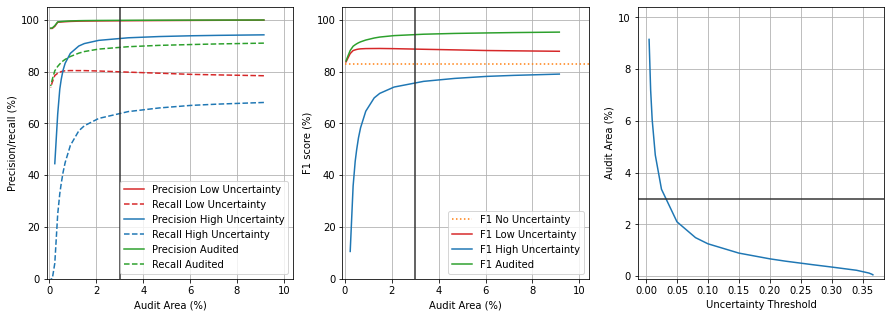

In [ ]:
'''
xlim = [-0.3, 12.7]
xlim = [-0.1, 10.4]

ylim = [0, 105]
'''
manager.plotUncertaintyAA(normalize_xlim=False)

In [ ]:
manager.dataset.paths.im_filenames[dates[1]][0]
manager.dataset.paths.optical_im_past_dates[dates[1]]

'D:/Jorge/datasets/sentinel2/MS/2020'

In [ ]:
if config['georreferenced_save'] == True:
    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_uncertainty_georreferenced.tif'.format(
        manager.dataset.site)
    print("manager.uncertainty_to_show.shape", manager.uncertainty_to_show.shape)
    save_georreferenced(manager.uncertainty_to_show, original_im_path,produced_im_path)


In [ ]:
manager.predicted_unpad.shape

(18605, 19480)

In [ ]:

if config['georreferenced_save'] == True:
    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_uncertainty_georreferenced_jet.tif'.format(
        manager.dataset.site)

    jet_colormap_image = plt.get_cmap('jet')(manager.uncertainty_to_show)[..., :-1]
    jet_colormap_image = (jet_colormap_image * 255).astype('uint8')
    save_georreferenced(jet_colormap_image, original_im_path,produced_im_path, bands = 3)


In [ ]:
if config['georreferenced_save'] == True:
    del jet_colormap_image

In [ ]:
if config['georreferenced_save'] == True:
    # jet_colormap_image.shape
    jet_colormap_image = plt.get_cmap('jet')(manager.uncertainty_to_show)
    jet_colormap_image = (jet_colormap_image * 255).astype('uint8')

In [ ]:
if config['georreferenced_save'] == True:
    print(np.min(jet_colormap_image), np.max(jet_colormap_image))

In [ ]:
if config['georreferenced_save'] == True:
    plt.imshow(jet_colormap_image[...,:-1])

In [ ]:
if config['georreferenced_save'] == True:
    predicted_to_show = manager.predicted_unpad.copy()
    predicted_to_show[manager.label_mask == 2] = 0 # 1 for deforestation. 0 for the rest

    false_positive_mask = predicted_to_show - manager.label_mask_current_deforestation # 0 for correct. 1 for false positive. -1 for false negative
    false_positive_mask = (false_positive_mask + 1).astype(np.int8) # 1 for correct. 2 for false positive. 0 for false negative
    del predicted_to_show
    ic(np.unique(false_positive_mask, return_counts=True))

    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_false_positive_mask_georreferenced.tif'.format(
        manager.dataset.site)
    print("false_positive_mask.shape", false_positive_mask.shape)
    save_georreferenced(false_positive_mask, original_im_path,produced_im_path)

    # del false_positive_mask


In [ ]:
if config['georreferenced_save'] == True:
    predicted_georreferenced = manager.predicted_unpad.copy()
    predicted_georreferenced[manager.label_mask == 2] = 2 

    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_predicted_georreferenced.tif'.format(
        manager.dataset.site)
    print("predicted_georreferenced.shape", predicted_georreferenced.shape)
    save_georreferenced(predicted_georreferenced, original_im_path,produced_im_path)
    del predicted_georreferenced



In [ ]:

if config['georreferenced_save'] == True:
    visual_roi_mask = np.zeros_like(false_positive_mask)

    if config['site'] == 'MS':
        lims = manager.dataset.previewLims0
        visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1
        lims = manager.dataset.previewLims3
        visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1
        lims = manager.dataset.previewLims4
        visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1

    if config['site'] == 'PI':
        lims = manager.dataset.previewLims0
        visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1

        lims = manager.dataset.previewLims3
        visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1

        lims = manager.dataset.previewLims4
        visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1

    lims = manager.dataset.previewLims1
    visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1

    lims = manager.dataset.previewLims2
    visual_roi_mask[lims[0]:lims[1], lims[2]:lims[3]] = 1

    print(visual_roi_mask.shape)
    # visual_roi_mask_pad = rasterTools.padForGeorreferencingPA(visual_roi_mask)


    fig, ax = plt.subplots(figsize=(10,10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(visual_roi_mask, cmap='jet')
    plt.axis('off')

    produced_im_path = 'D:/Jorge/deforestation_uncertainty/georreferenced/{}_visual_roi_georreferenced.tif'.format(
        manager.dataset.site
    )
    rasterTools.GeoReference_Raster_from_Source_data(original_im_path, 
                    np.expand_dims(visual_roi_mask, axis=0).astype(np.float32), produced_im_path, bands = 1,
                    nodata=-1)

In [ ]:
# print(previewLims0)

# print(previewLims3)

# print(previewLims4)

print(manager.dataset.previewLims1)

print(manager.dataset.previewLims2)

[13250 14250  4000  5000]
[13500 14500 16250 17250]
